In [1]:
import pandas as pd
import matplotlib.pyplot as plt  # To visualize
import seaborn as sns
import numpy as np
from tabulate import tabulate #To create pretty tables
from sklearn.metrics import r2_score
import os, sys

from IPython.core.display import display, HTML
display(HTML("<style>.container { width:90% !important; }</style>"))

In [2]:
directory = "/home/jeanpierre/LibraMetrics/containersMetricsFiles/Experiment1_final_increasing/2020_09_22__08_18_48"
#directory = "/home/jeanpierre/libra2/libra2/experiments_logs/Experiment1/5_nodes/2020_09_18__14_07_08/"

In [3]:
# Load:"CPU_LOAD_DATAFRAME"
def get_cpu_dataframe(directory):
    cpu_dataframe = pd.read_csv(directory + "merged/jp_cpu_load.csv", names=["load", "timestamp"])
    return cpu_dataframe

# Load:"MEMPOOL_SIZE"
def get_mempool_size_dataframe(directory):
    mempool_size_dataframe = pd.read_csv(directory + "merged/jp_mempool_size.csv", names=["size", "timestamp"])
    return mempool_size_dataframe

In [4]:
# Get the blockstore dataframe
def get_blockstore_dataframe_and_block_saturation(directory):
    #Load in both client txns start time and end times
    ac_dataframe = pd.read_csv(directory + "merged/jp_ac_client_transaction.csv", names=["address", "sequence_number", "timestamp"])
    f = open(directory + "merged/jp_blockstore_process_block.csv")
    lines = f.read().split("\n")
    f.close()

    dictionary = {"address":[], "sequence_number":[], "timestamp":[]}

    #To hold the block saturations
    block_saturation = []
    
    #Parse blockstore into a dataframe
    for x in range(len(lines)-1):
        line = lines[x].replace('"', '')
        parts = line.split(",")
        block_saturation.append([int(parts[0]), int(max(len(parts)-1, 0))])
        
        for y in range(1, len(parts)):
            acc_seq = parts[y].split(":")
            dictionary["address"].append(acc_seq[0])
            dictionary["sequence_number"].append(acc_seq[1])
            dictionary["timestamp"].append(parts[0])
            
    block_saturation = pd.DataFrame(data=block_saturation, columns=['timestamp', 'saturation'])
    
    blockstore_dataframe = pd.DataFrame(dictionary)
    blockstore_dataframe[['sequence_number', 'timestamp']] = blockstore_dataframe[['sequence_number', 'timestamp']].apply(pd.to_numeric)

    #left join to add commit times
    result = pd.merge(ac_dataframe, blockstore_dataframe, how='left', on=['address', 'sequence_number'], suffixes=['_submit', '_commit'])
    #remove the first and last 10% of the data
    #result = result.head(int(len(result)*(90/100)))
    #result = result.tail(int(len(result)*(90/100)))

    #calculate the txn_latency and relative_txn_start_time, then add it to the result dataframe
    result['txn_latency(ms)'] = result['timestamp_commit'] - result['timestamp_submit']
    result['txn_rel_commit_time'] = (result['timestamp_commit'] - result['timestamp_submit'].min())/1000

    result.sort_values(by=['timestamp_submit'], inplace=True, ignore_index=True)
    return result, block_saturation

In [5]:
def get_blockstore_dataframe(directory):
    #Load in both client txns start time and end times
    ac_dataframe = pd.read_csv(directory + "merged/jp_ac_client_transaction.csv", names=["address", "sequence_number", "timestamp"])
    f = open(directory + "merged/jp_blockstore_process_block.csv")
    lines = f.read().split("\n")
    f.close()

    dictionary = {"address":[], "sequence_number":[], "timestamp":[]}
    
    #Parse blockstore into a dataframe
    for x in range(len(lines)-1):
        line = lines[x].replace('"', '')
        parts = line.split(",")
        
        for y in range(1, len(parts)):
            acc_seq = parts[y].split(":")
            dictionary["address"].append(acc_seq[0])
            dictionary["sequence_number"].append(acc_seq[1])
            dictionary["timestamp"].append(parts[0])
    
    blockstore_dataframe = pd.DataFrame(dictionary)
    blockstore_dataframe[['sequence_number', 'timestamp']] = blockstore_dataframe[['sequence_number', 'timestamp']].apply(pd.to_numeric)

    #left join to add commit times
    result = pd.merge(ac_dataframe, blockstore_dataframe, how='left', on=['address', 'sequence_number'], suffixes=['_submit', '_commit'])
    #remove the first and last 10% of the data
    #result = result.head(int(len(result)*(90/100)))
    #result = result.tail(int(len(result)*(90/100)))

    #calculate the txn_latency and relative_txn_start_time, then add it to the result dataframe
    result['txn_latency(ms)'] = result['timestamp_commit'] - result['timestamp_submit']
    result['txn_rel_commit_time'] = (result['timestamp_commit'] - result['timestamp_submit'].min())/1000

    result.sort_values(by=['timestamp_submit'], inplace=True, ignore_index=True)
    return result

In [6]:
def plot_throughput_commit_times(result, directory, block_saturation, time_window, graph_name):
    #Find the maximum throughput
    X_res = []
    Y_res = []
    max_throughput = 0
    max_throughput_time = 0
    for x in range(int(max(result['txn_rel_commit_time']))):
        rows = result.loc[(result['txn_rel_commit_time'] >= x) & (result['txn_rel_commit_time'] < x+time_window)]
        X_res.append(x)
        Y_res.append(len(rows) / time_window)
        if len(rows) > max_throughput:
            max_throughput = len(rows)
            max_throughput_time = x

    max_throughput = max_throughput / time_window
    
    #Create a scatterplot with 2 Y-axis, txn_latency and txn_througput
    fig, (ax00, ax10, ax20, ax30) = plt.subplots(4, 1, figsize=(16,10), gridspec_kw={'height_ratios':[5,2,2,2], 'hspace':0.20})
    #fig, (ax00, ax30) = plt.subplots(2, 1, figsize=(16,6), gridspec_kw={'height_ratios':[3,1], 'hspace':0.15})
    ax01 = ax00.twinx()
    sns.scatterplot(x=result['txn_rel_commit_time'], y=result['txn_latency(ms)']/1000, label='Data point', marker='.', size=1, ax=ax00)
    
    #ax00.axhline(y=10, xmax=max(X_res), c='black', ls='--')
    
    ax01.plot(X_res, Y_res, color='red', label='Throughput (txns/s)')
    ax00.set_xlim(right=max(result['txn_rel_commit_time']))
    
    #plot a vertical line at the maximum throughput
    ax01.vlines([max_throughput_time, (max_throughput_time + time_window)], 0, max_throughput, label="Maximum Throughput Interval")
    ax01.text(max_throughput_time, max_throughput - max_throughput*0.5, str(round(max_throughput, 2)) + " txns/s", fontsize=12)
    
    ax01.set_ylim(bottom=0, top=int(max_throughput))

    #ax00.set_title(graph_name, fontsize=16)
    #ax00.set_xlabel('Time (s)')
    ax00.set_xlabel('')
    ax00.set_ylabel('Txn commit time (s)', color='blue', fontweight='bold')
    ax01.set_ylabel('Throughput (txn/s)', color='red', fontweight='bold')
    ax00.get_legend().remove()
    
    ax00.xaxis.label.set_size(14)
    ax00.yaxis.label.set_size(14)
    ax01.yaxis.label.set_size(14)
    ax00.xaxis.set_tick_params(labelsize=12)
    ax00.yaxis.set_tick_params(labelsize=12)
    ax01.yaxis.set_tick_params(labelsize=12)
    
    ax01.legend(fontsize=12)

    avg_throughput = len(result) / max(result['txn_rel_commit_time'])
    #print("Average Throughput: " + str(avg_throughput))
    #print("Maximum Throughput: " + str(max_throughput) + " at time: " + str(max_throughput_time))

    # Plot the CPU-load
    cpu_dataframe = get_cpu_dataframe(directory)
    
    ax10.set_xlim(plt.axis()[0], plt.axis()[1])
    ax10.set_ylim(0, 100)
    ax10.set_ylabel('CPU-load', fontweight='bold')

    ax10.plot((cpu_dataframe['timestamp'] - result['timestamp_submit'].min())/1000, cpu_dataframe['load'], color='red', label='Throughput (txn/s)')

    ax11 = ax10.twinx()
    ax11.set_ylim(0, 100)
    
    ax10.xaxis.label.set_size(14)
    ax10.yaxis.label.set_size(14)
    ax11.yaxis.label.set_size(14)
    ax10.xaxis.set_tick_params(labelsize=12)
    ax10.yaxis.set_tick_params(labelsize=12)
    ax11.yaxis.set_tick_params(labelsize=12)
    
    ax10.grid(axis='y')
    
    # Plot the block saturation
    block_saturation_time = []
    for counter in range(0, len(block_saturation)):
        block_saturation_time.append((block_saturation.at[counter,'timestamp'] - result['timestamp_submit'].min())/1000)
        
    ax20.set_xlim(plt.axis()[0], plt.axis()[1])
    ax20.set_ylim(0, max(block_saturation['saturation'])+20)
    #ax20.set_xlabel('Time (s)')
    ax20.set_ylabel('Block size', fontweight='bold')
    
    ax20.plot(block_saturation_time, block_saturation['saturation'], color='red', label='Block saturation (txns)')
    
    ax21 = ax20.twinx()
    ax21.set_ylim(0, max(block_saturation['saturation'])+20)
    
    ax20.xaxis.label.set_size(14)
    ax20.yaxis.label.set_size(14)
    ax21.yaxis.label.set_size(14)
    ax20.xaxis.set_tick_params(labelsize=12)
    ax20.yaxis.set_tick_params(labelsize=12)
    
    ax20.grid(axis='y')
    
    # Plot the mempool size
    df = get_mempool_size_dataframe(directory)
    
    df['x_data'] = (df['timestamp'] - result['timestamp_submit'].min())/1000
    ax30.plot(df['x_data'], df['size'], color='red', label='Block saturation (txns)')
    ax30.set_xlim(plt.axis()[0], plt.axis()[1])
    
    df = df[(df['x_data'] > plt.axis()[0]) & (df['x_data'] < plt.axis()[1])]
    ax30.set_xlabel('Time (s)', fontweight='bold')
    ax30.set_ylim(min(df['size']), max(df['size']))
    ax30.set_ylabel('Mempool size', fontweight='bold')
    
    ax31 = ax30.twinx()
    ax31.set_ylim(min(df['size']), max(df['size']))
    
    ax30.xaxis.label.set_size(14)
    ax30.yaxis.label.set_size(14)
    ax31.yaxis.label.set_size(14)
    ax30.xaxis.set_tick_params(labelsize=12)
    ax30.yaxis.set_tick_params(labelsize=12)
    
    ax30.grid(axis='y')
    
    return max_throughput_time, max_throughput

In [7]:
def get_max_throughput(result, time_window):
    #Find the maximum throughput
    max_throughput = 0
    for x in range(int(max(result['txn_rel_commit_time']))):
        rows = result.loc[(result['txn_rel_commit_time'] >= x) & (result['txn_rel_commit_time'] < x+time_window)]
        if len(rows) > max_throughput:
            max_throughput = len(rows)

    max_throughput = max_throughput / time_window
    return max_throughput

In [8]:
#directory = "/home/jeanpierre/libra2/libra2/experiments_logs/Experiment5/450_ping/2020_09_29__06_07_54/"
#blockstore_dataframe, block_saturation = get_blockstore_dataframe_and_block_saturation(directory)
#plot_throughput_commit_times(blockstore_dataframe, directory, block_saturation, 60, "test")

In [9]:
directory_exp1 = '/home/jeanpierre/libra2/libra2/experiments_logs/Experiment_compare_swarm_and_simulator/Experiment1/attempt1/'
directory_exp2 = '/home/jeanpierre/libra2/libra2/experiments_logs/Experiment2_constant/attempt3/'
directory_exp3 = '/home/jeanpierre/libra2/libra2/experiments_logs/Experiment3_constant/attempt3/'
directory_exp4 = '/home/jeanpierre/libra2/libra2/experiments_logs/Experiment4_constant/attempt3/'

2_nodes = 2020_11_18__15_30_06
3_nodes = 2020_11_18__16_09_18
4_nodes = 2020_11_18__16_26_40
5_nodes = 2020_11_18__16_55_38
6_nodes = 2020_11_18__17_37_10
7_nodes = 2020_11_18__18_07_27
8_nodes = 2020_11_18__18_38_34
9_nodes = 2020_11_18__19_10_35
10_nodes = 2020_11_18__19_43_31
11_nodes = 2020_11_18__20_24_25
12_nodes = 2020_11_18__20_52_49
13_nodes = 2020_11_18__21_36_49
14_nodes = 2020_11_18__22_15_01
15_nodes = 2020_11_18__22_54_49
16_nodes = 2020_11_18__23_11_17
2_nodes=1054
3_nodes=1022
4_nodes=983
5_nodes=908
6_nodes=832
7_nodes=775
8_nodes=725
9_nodes=675
10_nodes=677
11_nodes=626
12_nodes=600
13_nodes=550
14_nodes=550
15_nodes=491
16_nodes=481
Max throughput start times:
[39, 58, 69, 71, 78, 67, 51, 83, 81, 91, 94, 101, 117, 104, 117]


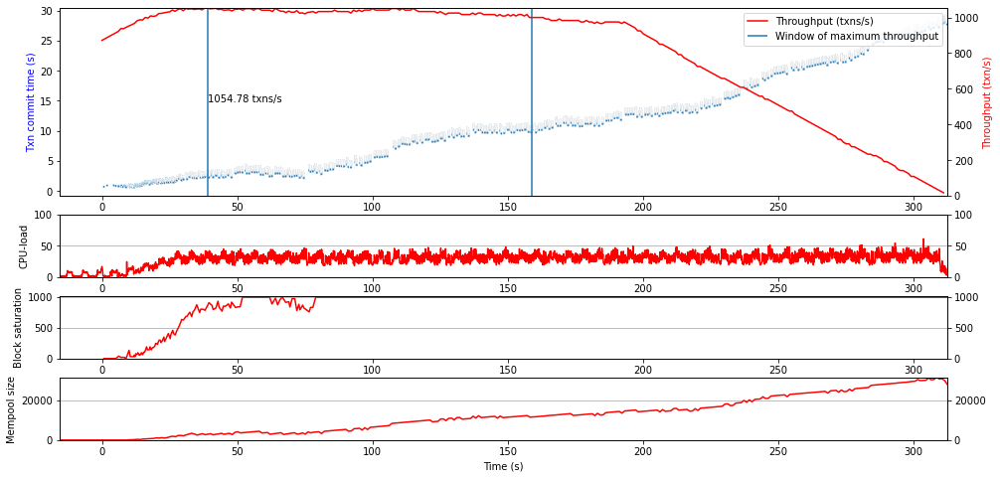

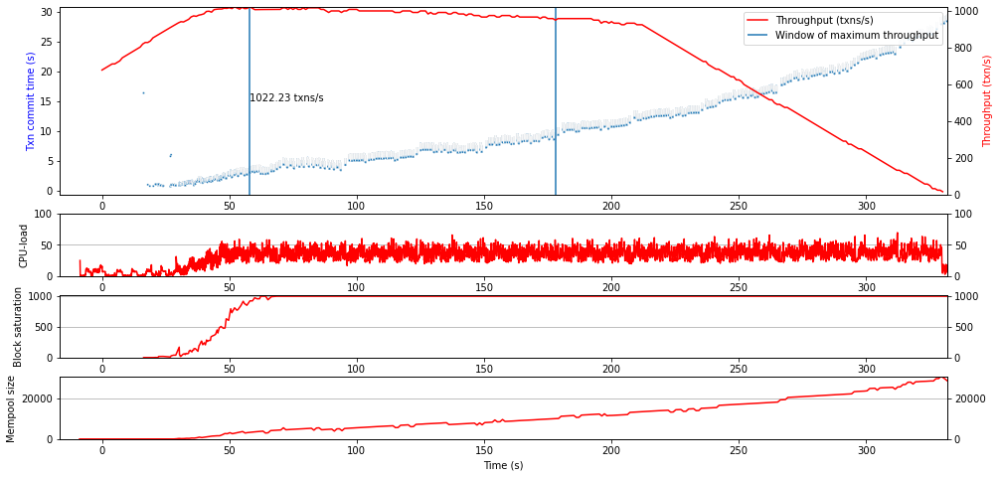

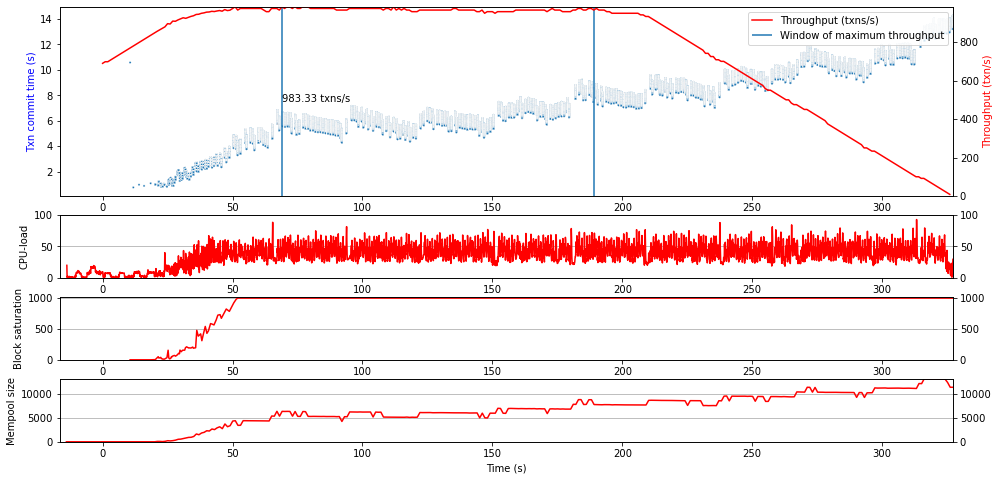

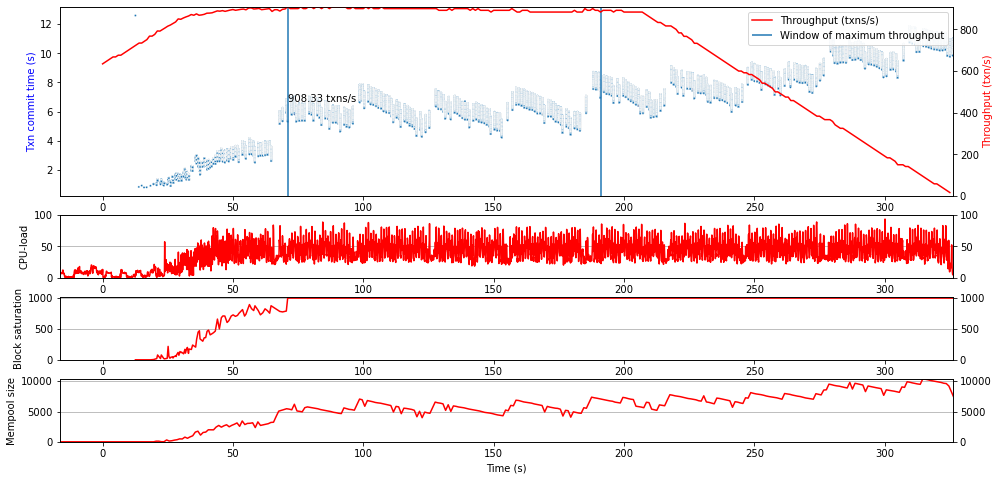

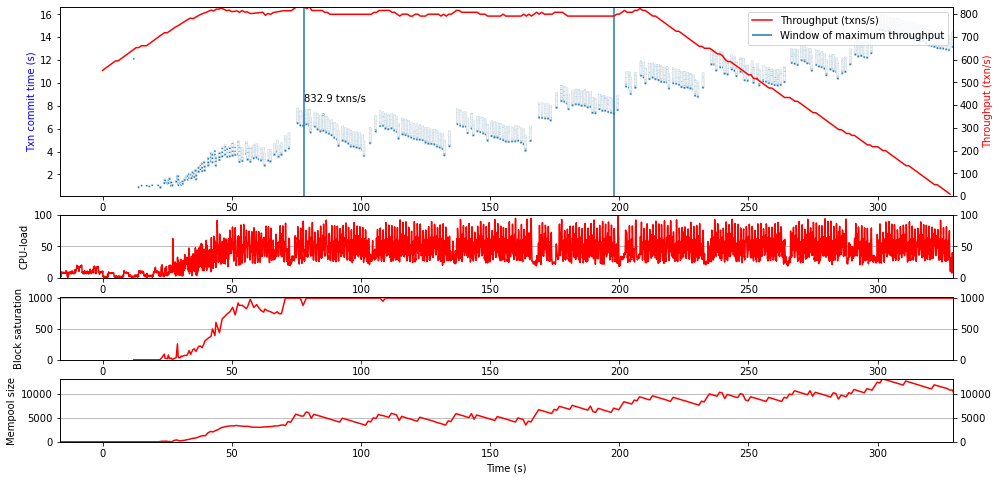

...

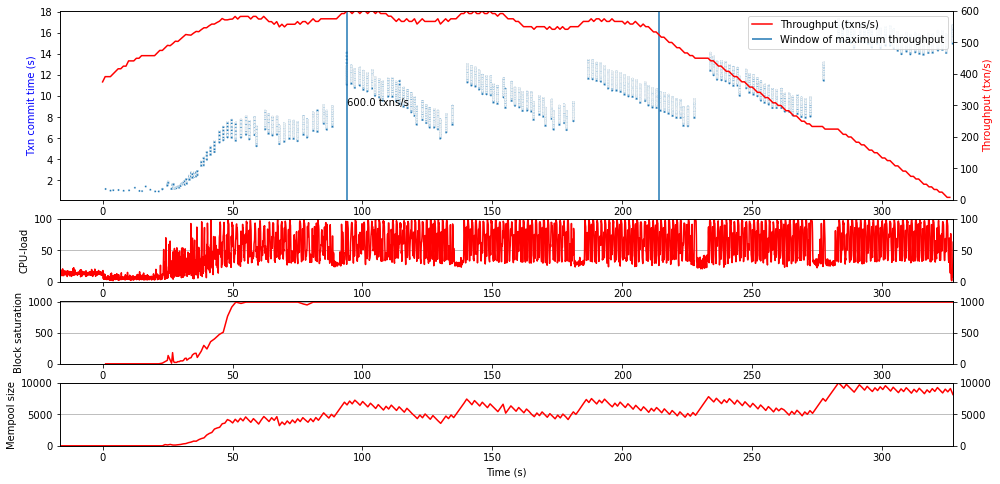

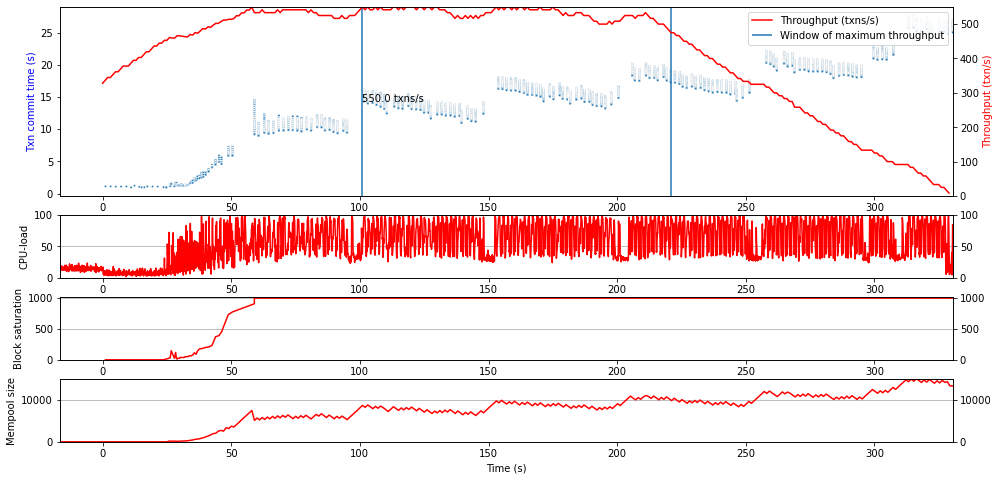

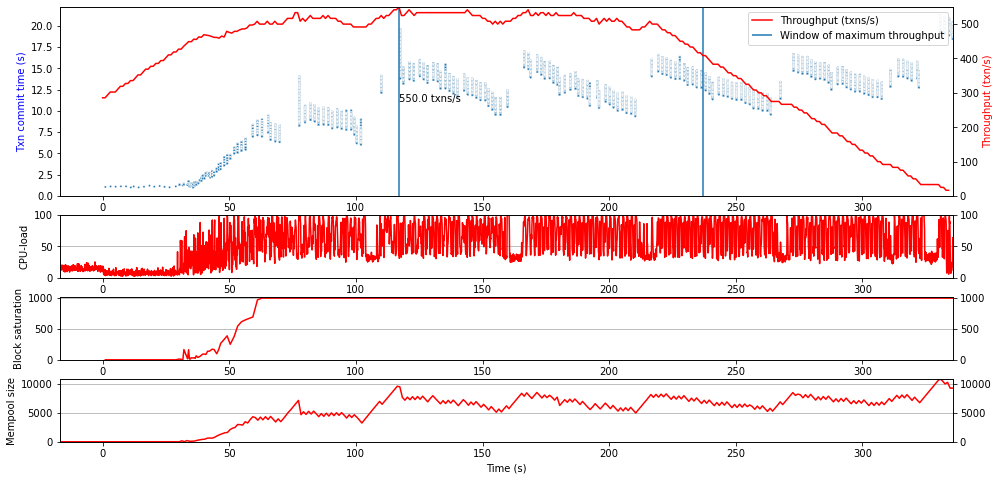

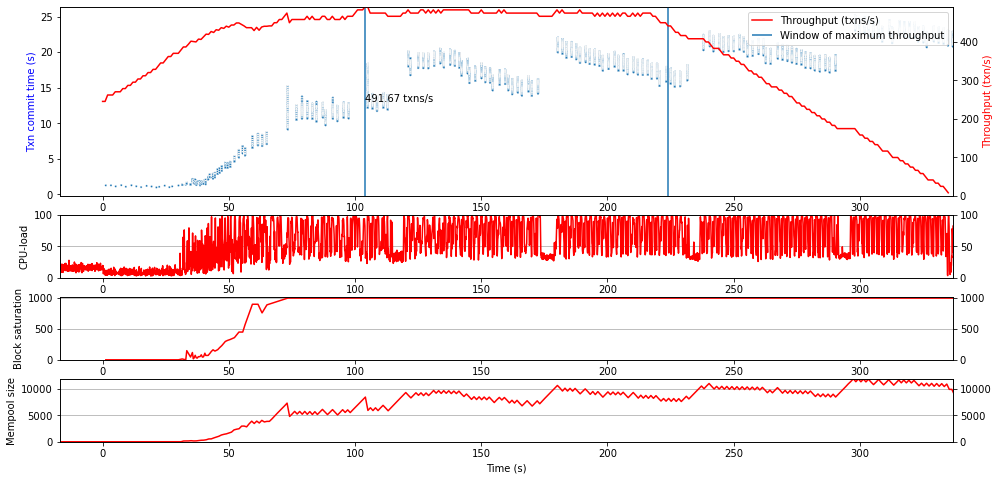

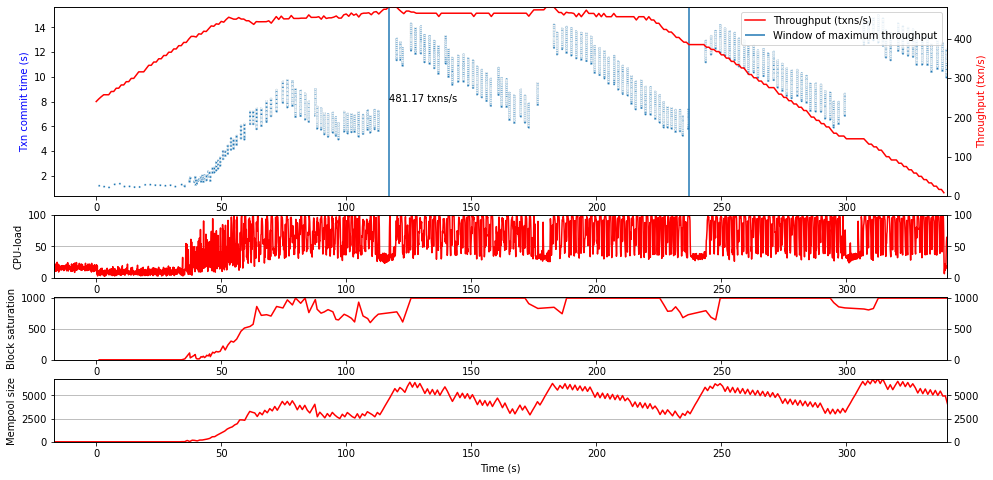

In [14]:
# Print the result graphs for experiment1
#directory_exp1 = '/home/jeanpierre/LibraMetrics/containersMetricsFiles/Experiment1_final_increasing/'
directory_exp1 = '/home/jeanpierre/libra2/libra2/experiments_logs/Experiment_compare_swarm_and_simulator/Experiment1/attempt1/'

time_window = 120

nr_nodes = []
nr_nodes_part1 = []
nr_nodes_part2 = []

for x_nodes in os.listdir(directory_exp1):
    nr_nodes_part1.append(int(x_nodes.split('_')[0]))
    nr_nodes_part2.append(str(x_nodes.split('_')[1]))

nr_nodes_part1.sort()
for node_nr in range(len(nr_nodes_part1)):
    nr_nodes.append(str(nr_nodes_part1[node_nr]) + "_" + nr_nodes_part2[node_nr])

max_throughput_start_times = []
max_throughput_experiment1 = []
for x_nodes in nr_nodes:
    for experiment_folder in os.listdir(directory_exp1 + x_nodes):
        print(x_nodes + ' = ' + experiment_folder)
        directory_tmp = directory_exp1 + x_nodes + "/" + experiment_folder + "/"
        blockstore_dataframe, block_saturation = get_blockstore_dataframe_and_block_saturation(directory_tmp)
        max_throughput_time, max_throughput_tmp = plot_throughput_commit_times(blockstore_dataframe, directory_tmp, block_saturation, time_window, "Txn Latency and Throughput of " + x_nodes)
        max_throughput_experiment1.append(x_nodes + "=" + str(int(max_throughput_tmp)))
        max_throughput_start_times.append(max_throughput_time)
        break
        
for line in max_throughput_experiment1:
    print(line)
    
print("Max throughput start times:")
print(max_throughput_start_times)

10_delay = 2020_11_20__10_14_24
30_delay = 2020_11_20__10_31_40
50_delay = 2020_11_20__11_17_56
70_delay = 2020_11_20__11_46_58
90_delay = 2020_11_20__12_10_27
110_delay = 2020_11_20__12_28_08
130_delay = 2020_11_20__12_51_43
150_delay = 2020_11_20__13_45_17
170_delay = 2020_11_20__13_57_06
190_delay = 2020_11_20__14_38_42
210_delay = 2020_11_20__14_56_45
230_delay = 2020_11_20__15_26_45
250_delay = 2020_11_20__15_50_50
10_delay=994
30_delay=964
50_delay=937
70_delay=926
90_delay=900
110_delay=883
130_delay=849
150_delay=829
170_delay=816
190_delay=796
210_delay=770
230_delay=742
250_delay=729
Max throughput start times:
[170, 186, 62, 100, 203, 114, 148, 156, 47, 76, 135, 132, 94]


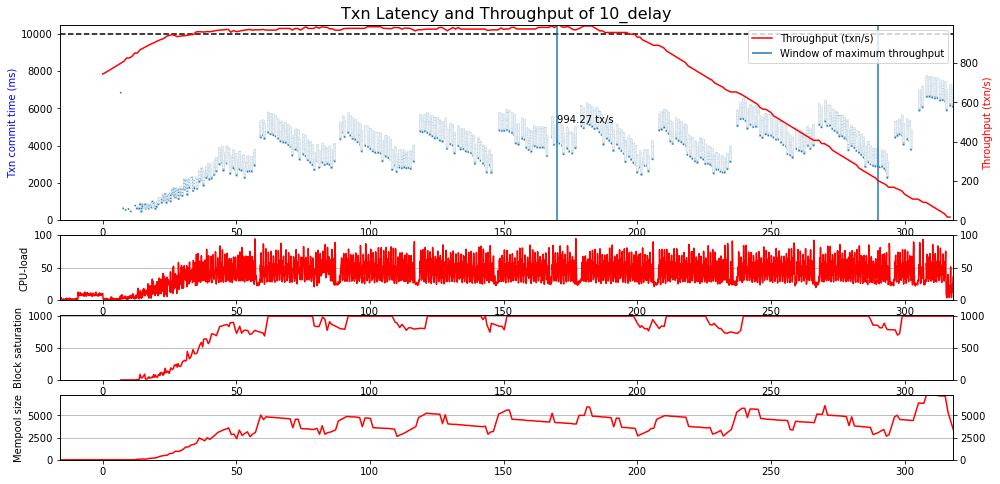

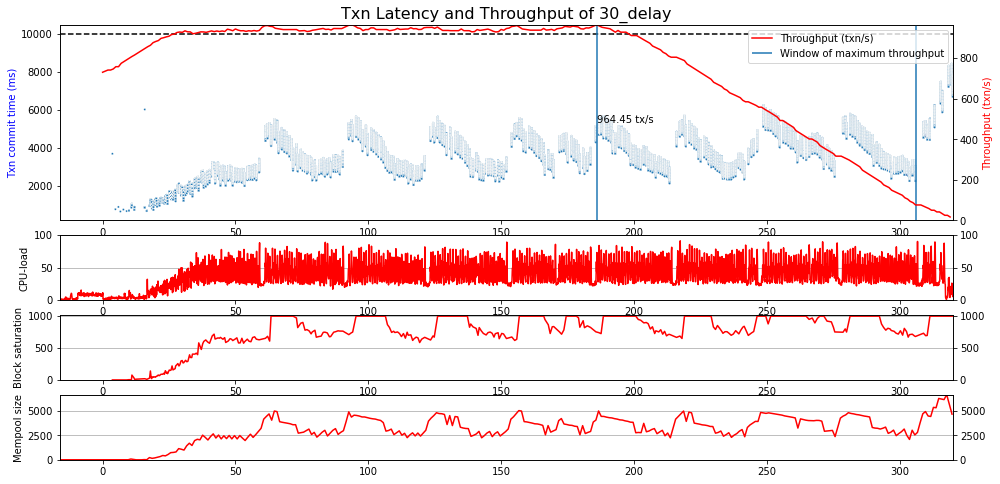

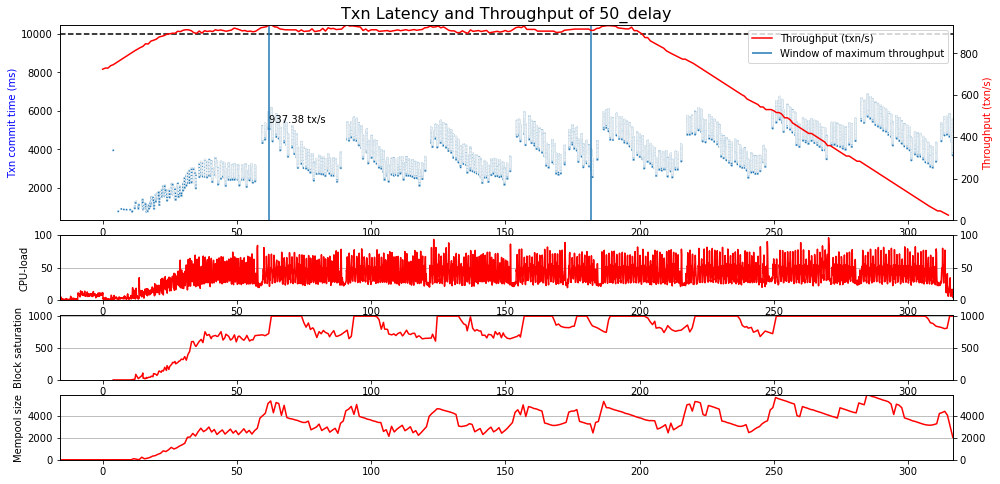

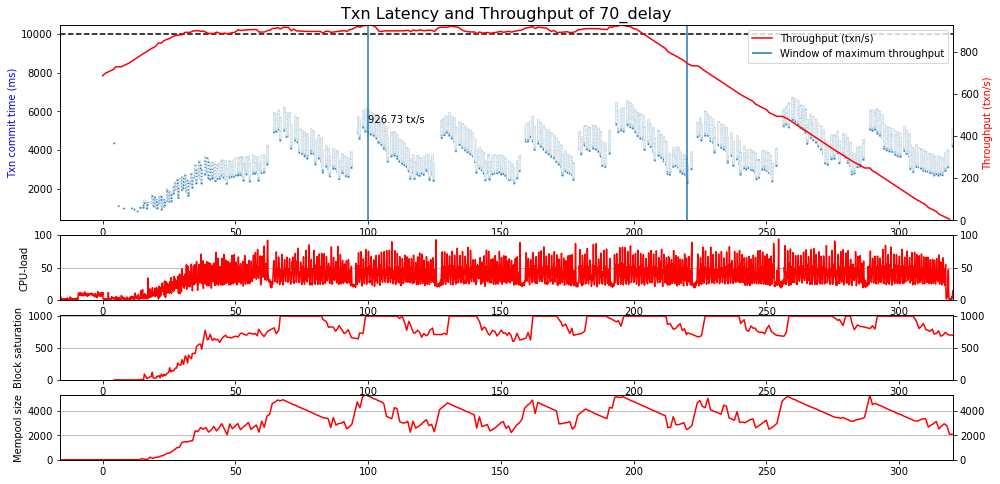

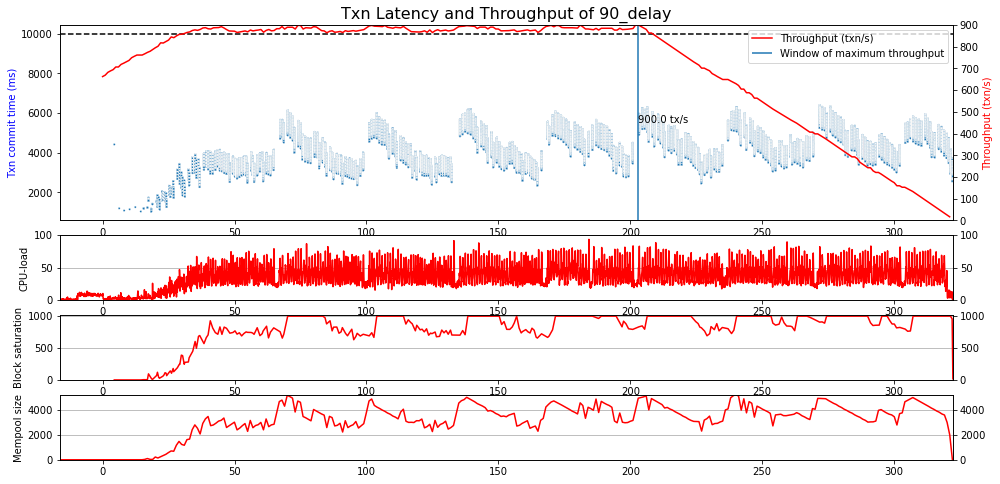

...

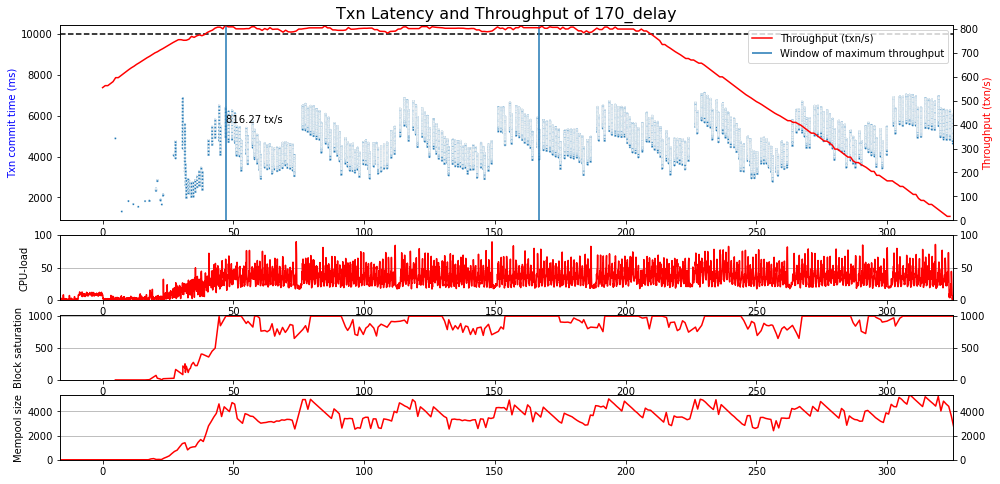

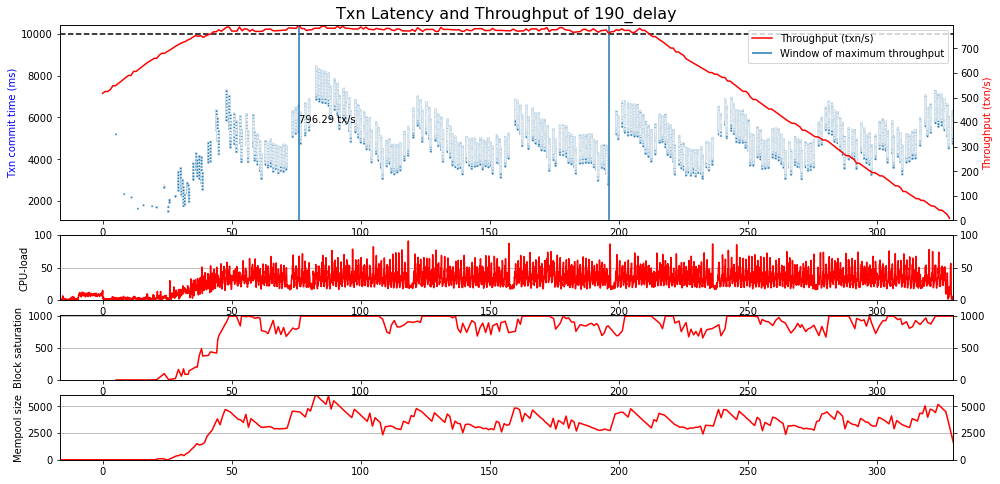

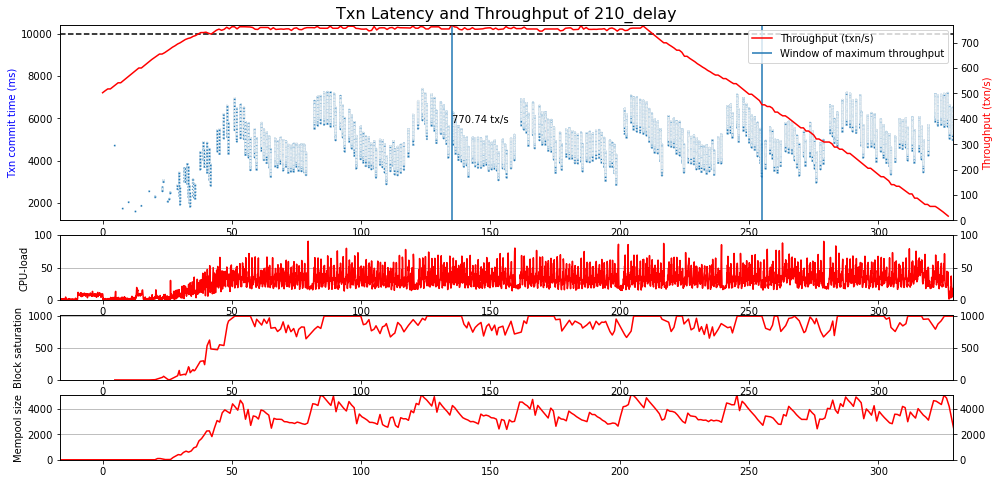

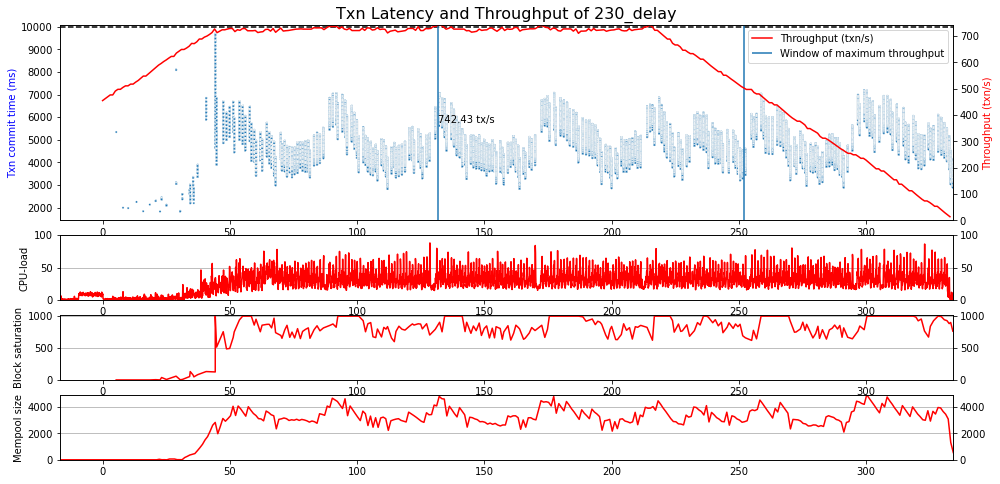

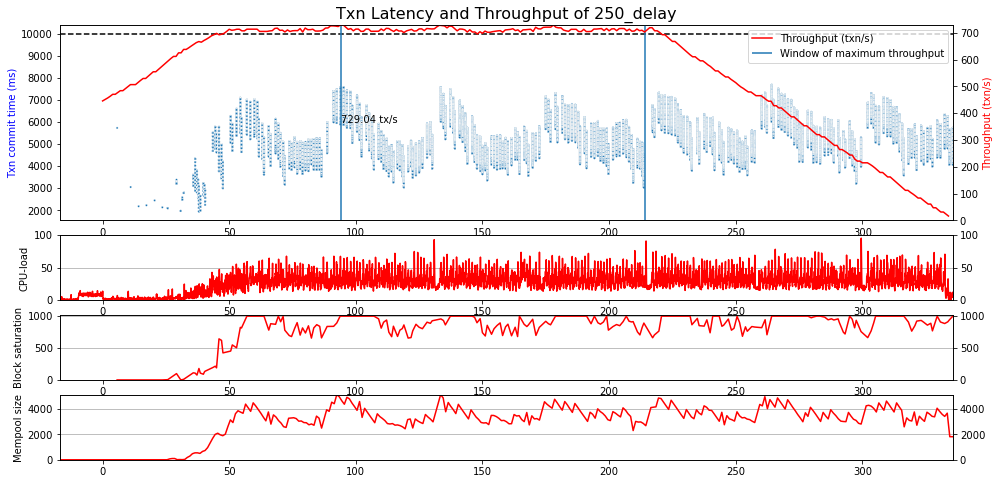

In [26]:
# Print the result graphs for experiment2
#directory_exp2 = '/home/jeanpierre/LibraMetrics/containersMetricsFiles/Experiment2_final_increasing/'
directory_exp2 = '/home/jeanpierre/libra2/libra2/experiments_logs/Experiment_compare_swarm_and_simulator/Experiment2/attempt1/'
time_window = 120

nr_nodes = []
nr_nodes_part1 = []
nr_nodes_part2 = []

for x_nodes in os.listdir(directory_exp2):
    nr_nodes_part1.append(int(x_nodes.split('_')[0]))
    nr_nodes_part2.append(str(x_nodes.split('_')[1]))

nr_nodes_part1.sort()
for node_nr in range(len(nr_nodes_part1)):
    nr_nodes.append(str(nr_nodes_part1[node_nr]) + "_" + nr_nodes_part2[node_nr])

max_throughput_start_times = []
max_throughput_experiment2 = []
for x_nodes in nr_nodes:
    for experiment_folder in os.listdir(directory_exp2 + x_nodes):
        print(x_nodes + ' = ' + experiment_folder)
        directory_tmp = directory_exp2 + x_nodes + "/" + experiment_folder + "/"
        blockstore_dataframe, block_saturation = get_blockstore_dataframe_and_block_saturation(directory_tmp)
        max_throughput_time, max_throughput_tmp = plot_throughput_commit_times(blockstore_dataframe, directory_tmp, block_saturation, time_window, "Txn Latency and Throughput of " + x_nodes)
        max_throughput_experiment2.append(x_nodes + "=" + str(int(max_throughput_tmp)))
        max_throughput_start_times.append(max_throughput_time)
        break
        
for line in max_throughput_experiment2:
    print(line)
    
print("Max throughput start times:")
print(max_throughput_start_times)

10_bandwidth = 2020_11_22__12_52_03
20_bandwidth = 2020_11_22__13_14_59
30_bandwidth = 2020_11_22__13_49_41
40_bandwidth = 2020_11_22__14_18_40
50_bandwidth = 2020_11_22__14_30_13
60_bandwidth = 2020_11_22__15_16_31
70_bandwidth = 2020_11_22__15_39_37
80_bandwidth = 2020_11_22__16_14_20
90_bandwidth = 2020_11_22__16_37_33
100_bandwidth = 2020_11_22__17_00_45
200_bandwidth = 2020_11_22__17_23_43
300_bandwidth = 2020_11_22__17_52_38
400_bandwidth = 2020_11_22__18_27_20
500_bandwidth = 2020_11_22__18_50_39
10_bandwidth=747
20_bandwidth=837
30_bandwidth=871
40_bandwidth=887
50_bandwidth=900
60_bandwidth=910
70_bandwidth=921
80_bandwidth=918
90_bandwidth=900
100_bandwidth=924
200_bandwidth=933
300_bandwidth=950
400_bandwidth=948
500_bandwidth=951
Max throughput start times:
[159, 194, 108, 102, 66, 193, 195, 195, 41, 131, 93, 93, 122, 157]


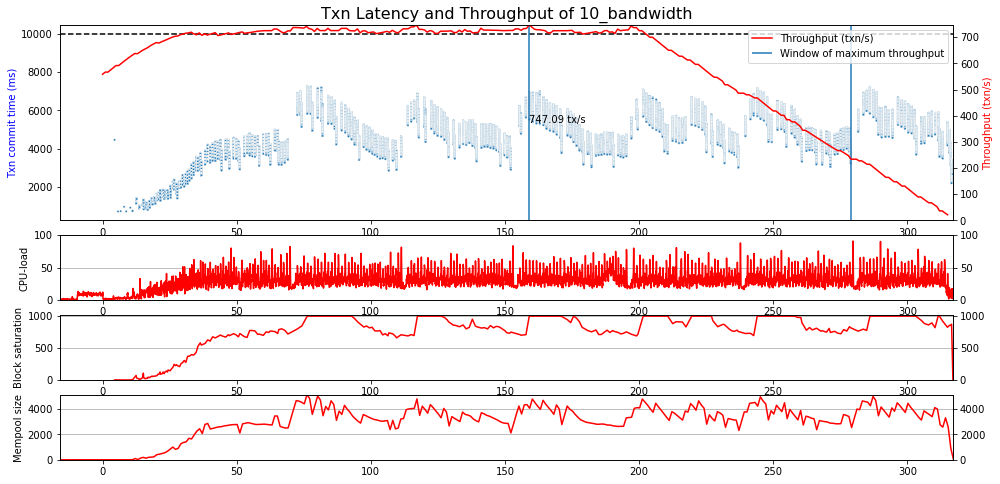

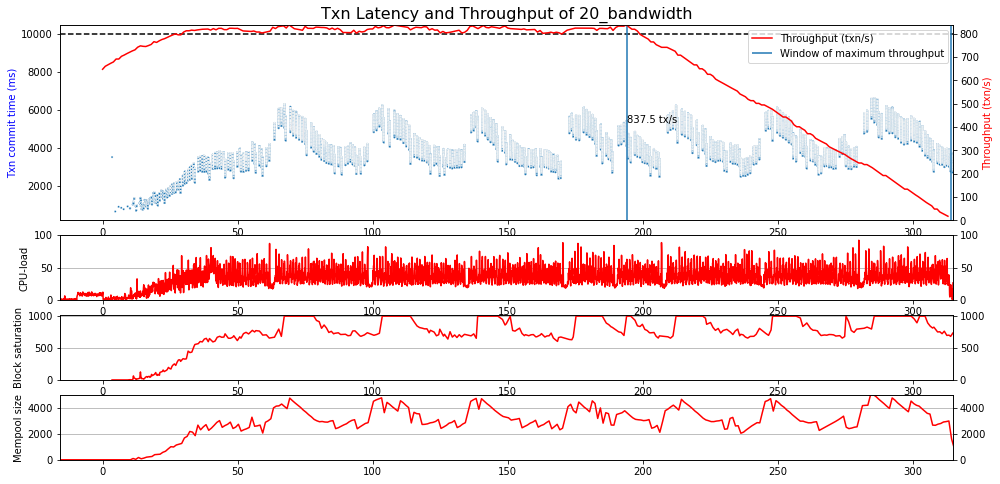

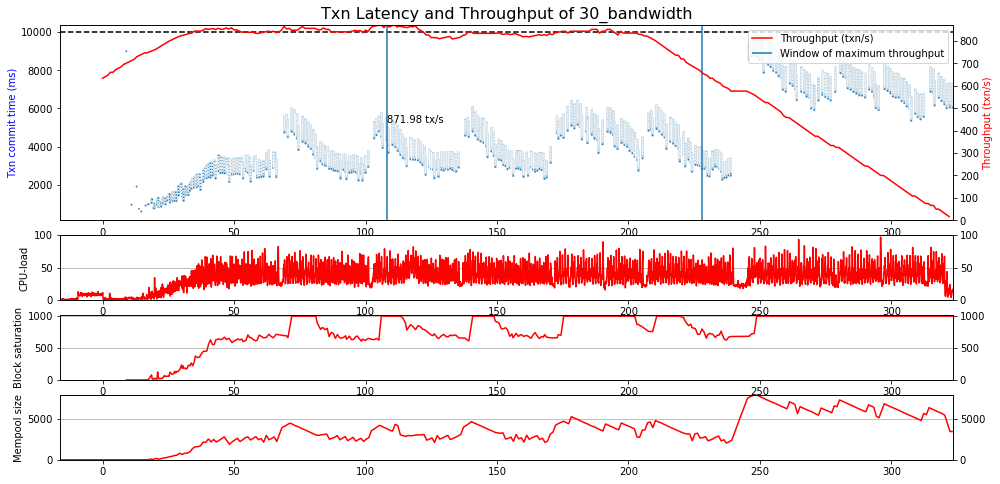

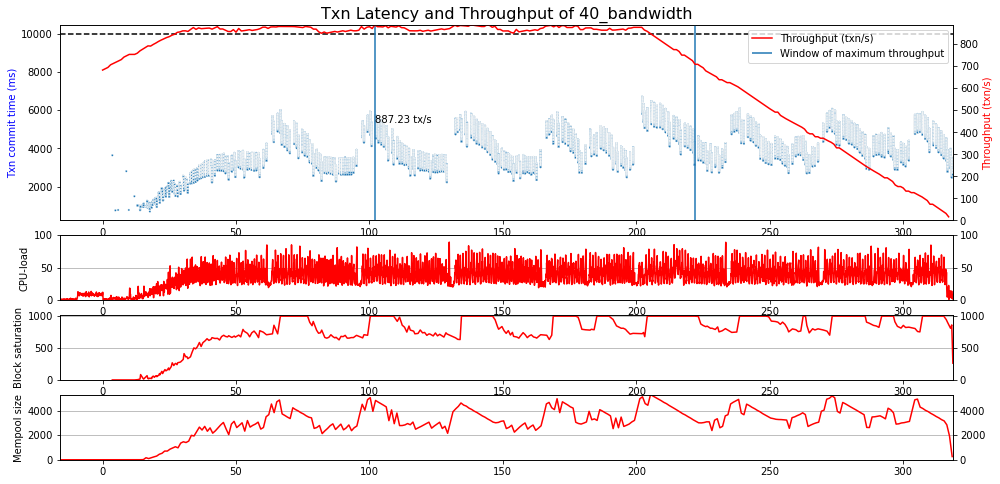

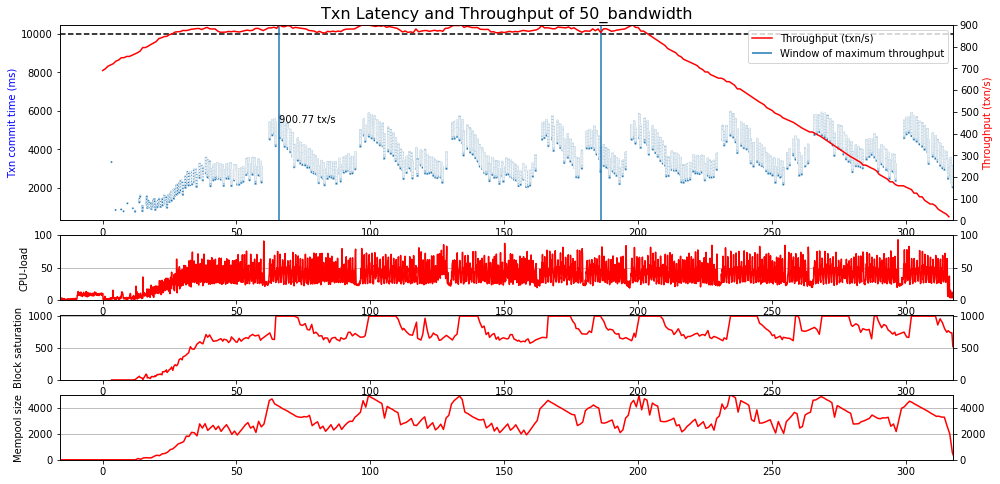

...

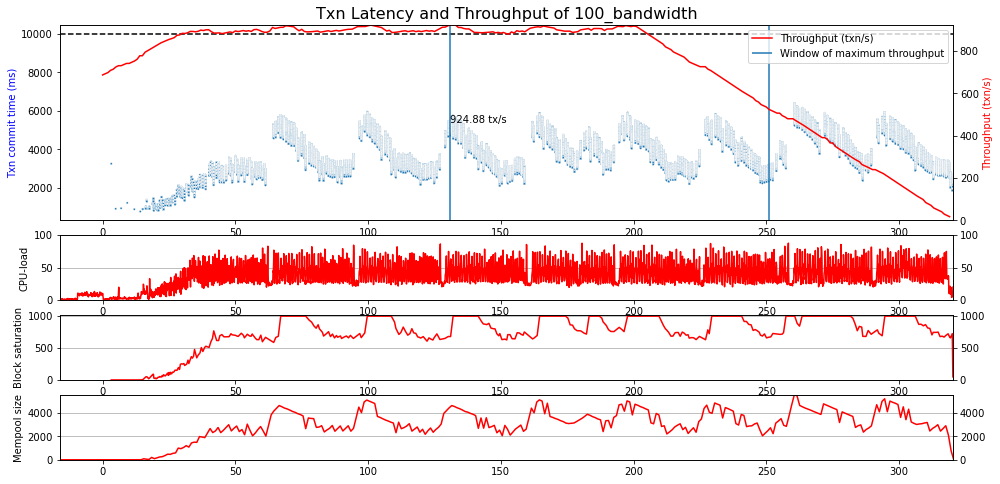

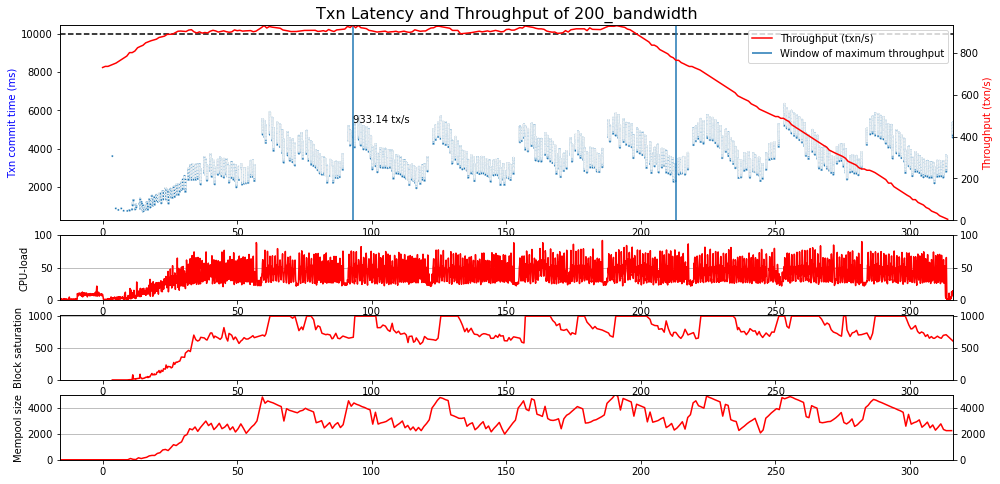

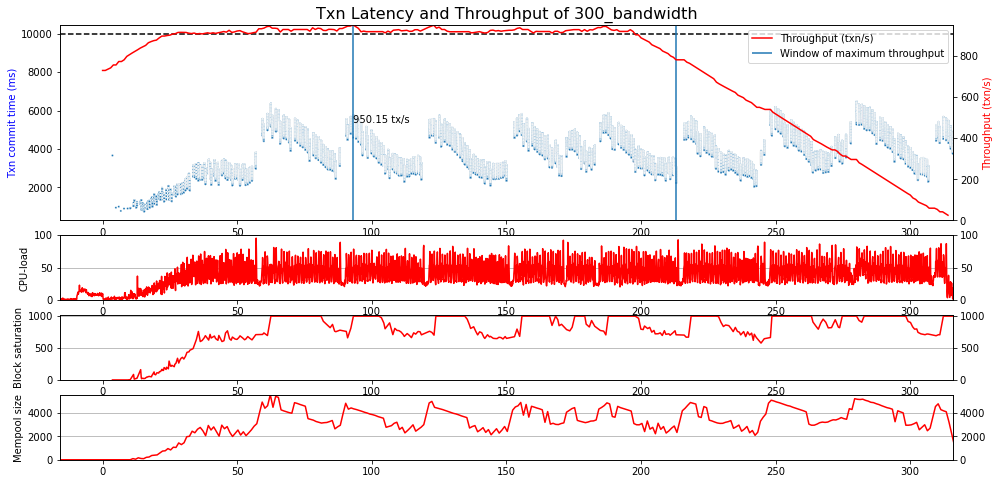

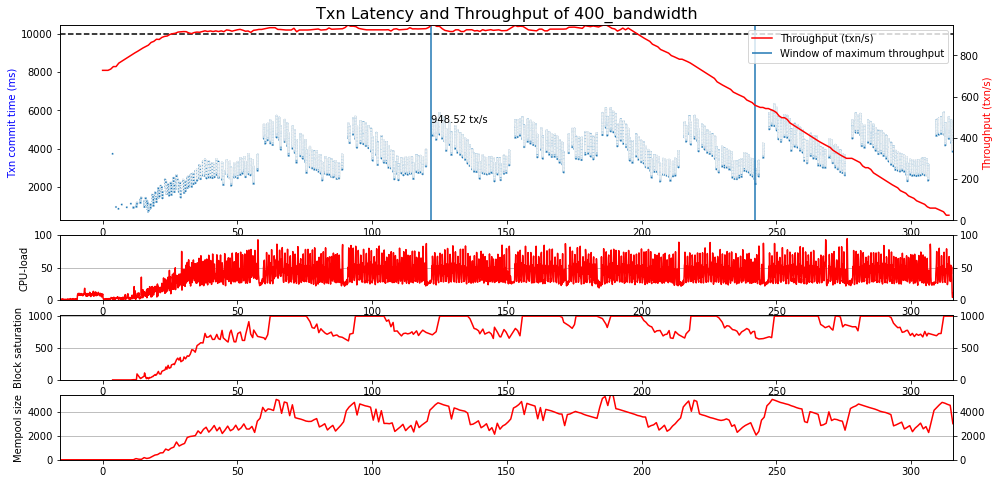

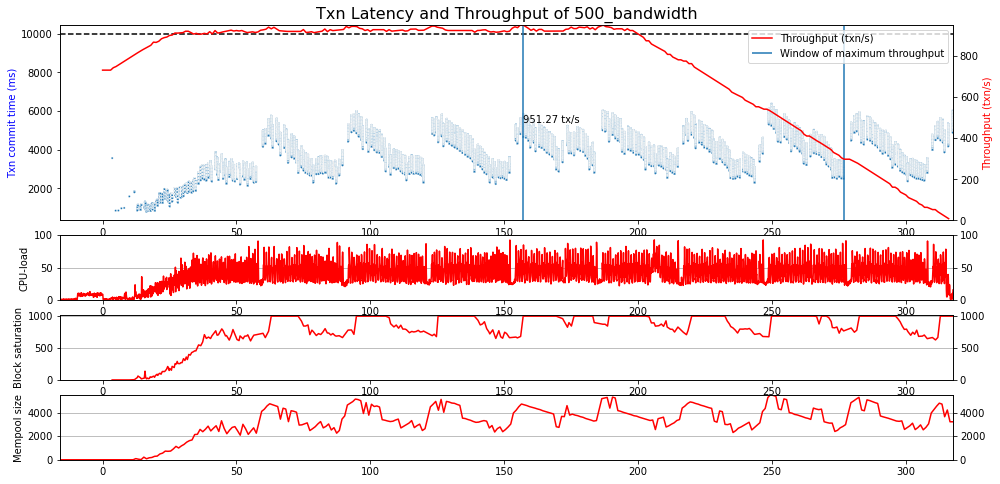

In [25]:
# Print the result graphs for experiment3
directory_exp3 = '/home/jeanpierre/libra2/libra2/experiments_logs/Experiment_compare_swarm_and_simulator/Experiment3/attempt1/'
#directory_exp3 = '/home/jeanpierre/LibraMetrics/containersMetricsFiles/Experiment3/'
time_window = 120

nr_nodes = []
nr_nodes_part1 = []
nr_nodes_part2 = []

for x_nodes in os.listdir(directory_exp3):
    nr_nodes_part1.append(int(x_nodes.split('_')[0]))
    nr_nodes_part2.append(str(x_nodes.split('_')[1]))

nr_nodes_part1.sort()
for node_nr in range(len(nr_nodes_part1)):
    nr_nodes.append(str(nr_nodes_part1[node_nr]) + "_" + nr_nodes_part2[node_nr])

max_throughput_start_times = []
max_throughput_experiment3 = []
for x_nodes in nr_nodes:
    for experiment_folder in os.listdir(directory_exp3 + x_nodes):
        print(x_nodes + ' = ' + experiment_folder)
        directory_tmp = directory_exp3 + x_nodes + "/" + experiment_folder + "/"
        blockstore_dataframe, block_saturation = get_blockstore_dataframe_and_block_saturation(directory_tmp)
        max_throughput_time, max_throughput_tmp = plot_throughput_commit_times(blockstore_dataframe, directory_tmp, block_saturation, time_window, "Txn Latency and Throughput of " + x_nodes)
        max_throughput_experiment3.append(x_nodes + "=" + str(int(max_throughput_tmp)))
        max_throughput_start_times.append(max_throughput_time)
        break
        
for line in max_throughput_experiment3:
    print(line)
    
print("Max throughput start times:")
print(max_throughput_start_times)

100_blocksize = 2020_11_22__20_35_12
200_blocksize = 2020_11_22__21_09_39
300_blocksize = 2020_11_22__21_26_58
400_blocksize = 2020_11_22__22_07_19
500_blocksize = 2020_11_22__22_19_02
600_blocksize = 2020_11_22__22_47_56
700_blocksize = 2020_11_22__23_22_27
800_blocksize = 2020_11_22__23_51_15
900_blocksize = 2020_11_23__00_26_00
1000_blocksize = 2020_11_23__00_49_12
1500_blocksize = 2020_11_23__01_29_41
2000_blocksize = 2020_11_23__02_04_37
100_blocksize=315
200_blocksize=484
300_blocksize=616
400_blocksize=710
500_blocksize=754
600_blocksize=822
700_blocksize=857
800_blocksize=903
900_blocksize=941
1000_blocksize=968
1500_blocksize=1023
2000_blocksize=1079
Max throughput start times:
[136, 99, 78, 75, 67, 69, 44, 196, 186, 89, 92, 150]


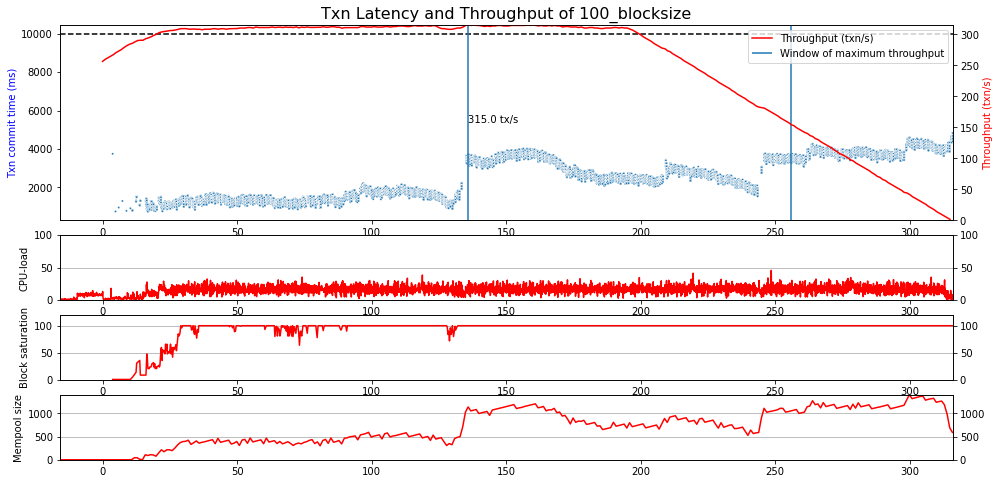

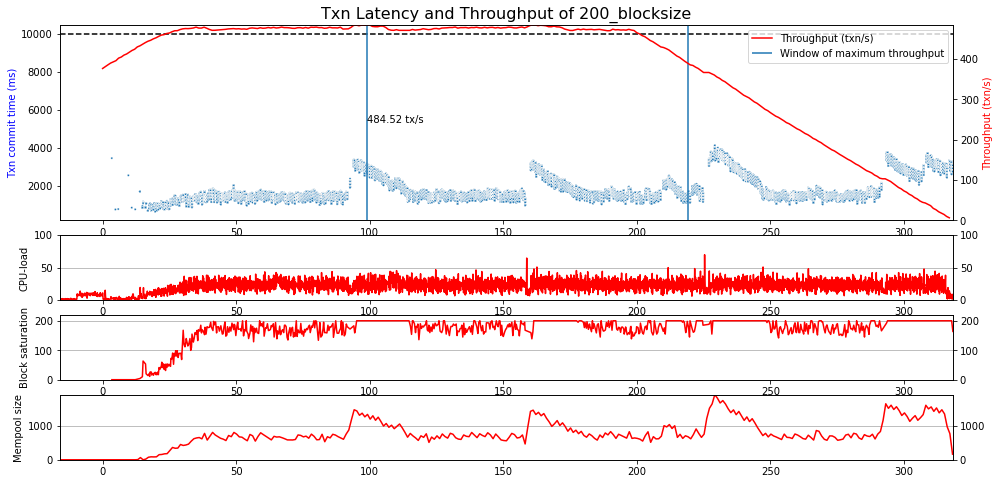

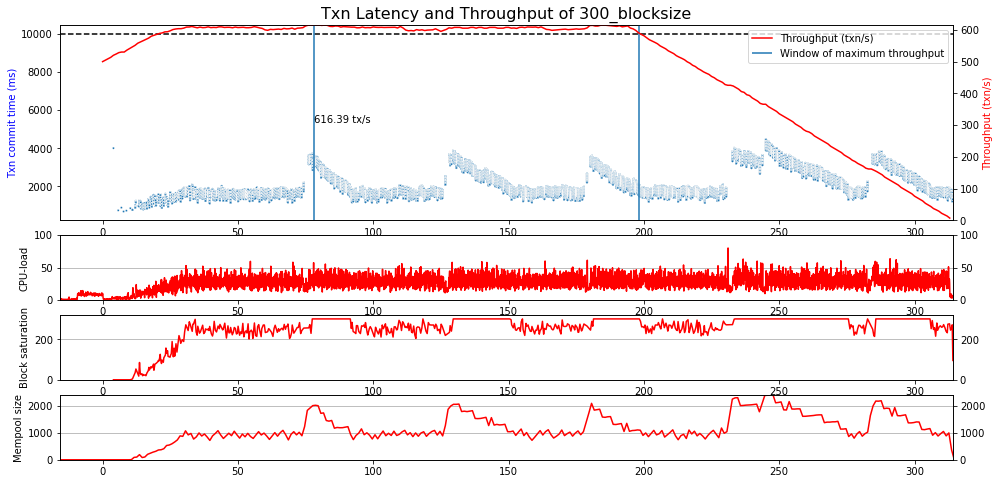

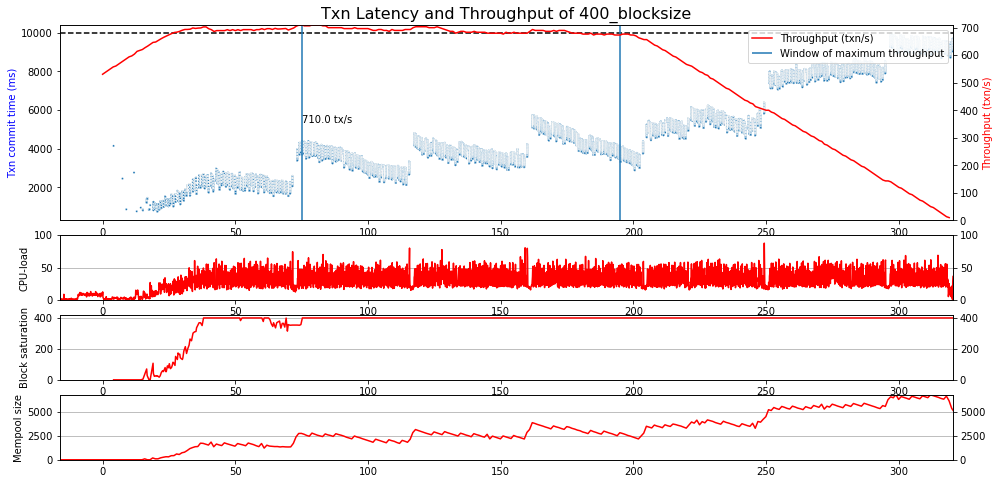

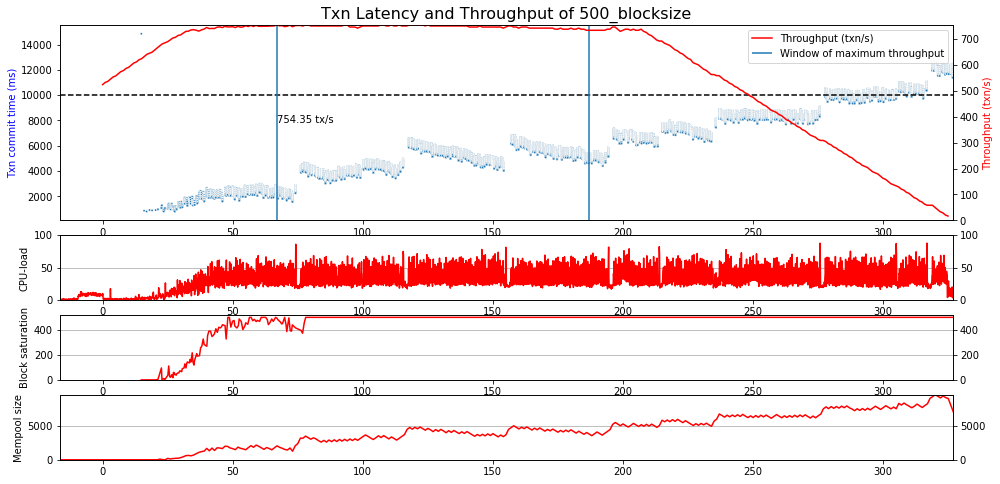

...

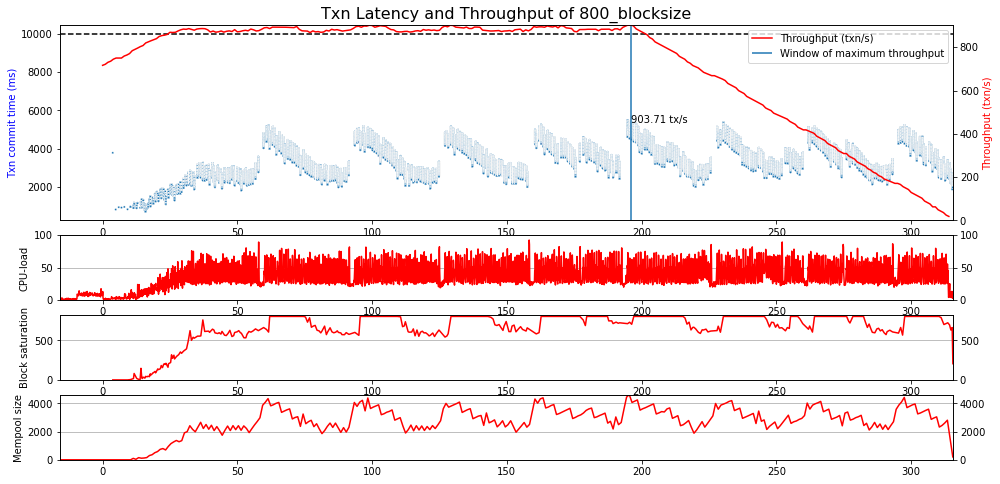

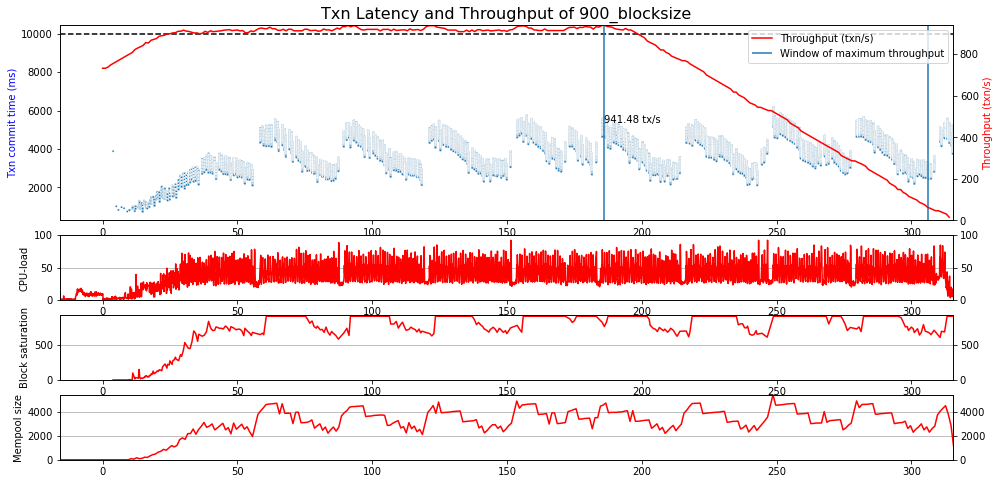

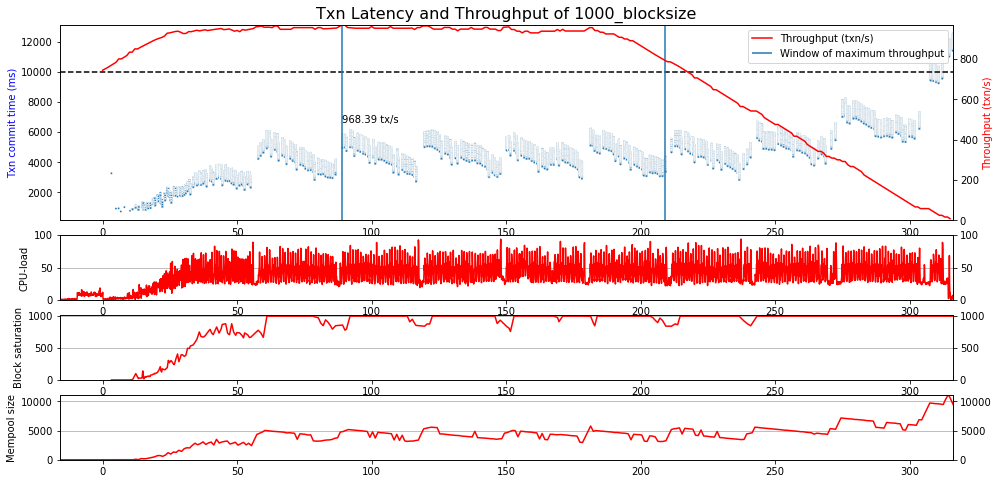

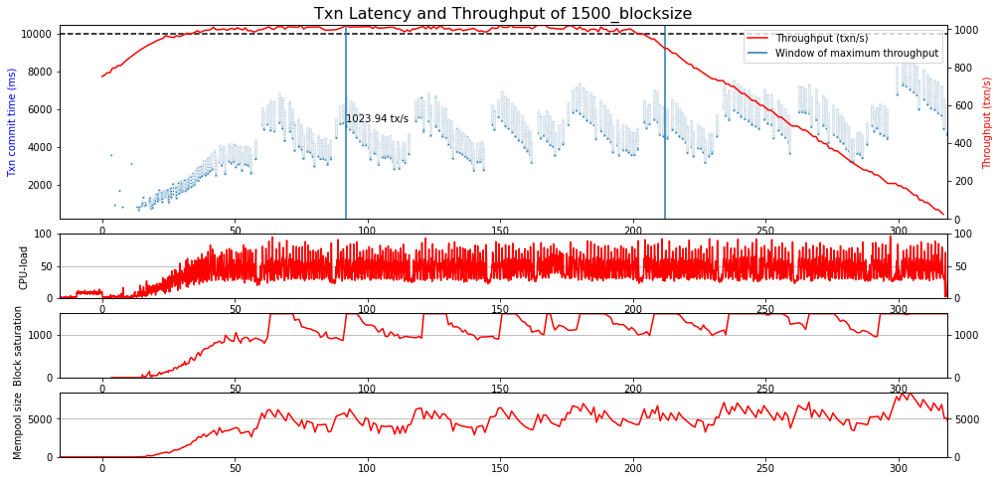

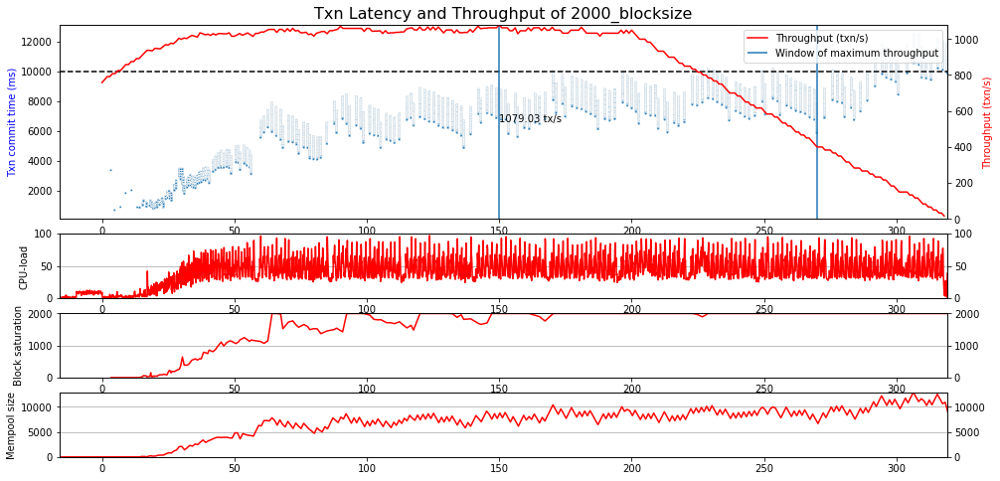

In [32]:
# Print the result graphs for experiment4
directory_exp4 = '/home/jeanpierre/libra2/libra2/experiments_logs/Experiment_compare_swarm_and_simulator/Experiment4/attempt1/'
#directory_exp4 = '/home/jeanpierre/LibraMetrics/containersMetricsFiles/Experiment4_final_increasing/'
time_window = 120

nr_nodes = []
nr_nodes_part1 = []
nr_nodes_part2 = []

for x_nodes in os.listdir(directory_exp4):
    nr_nodes_part1.append(int(x_nodes.split('_')[0]))
    nr_nodes_part2.append(str(x_nodes.split('_')[1]))

nr_nodes_part1.sort()
for node_nr in range(len(nr_nodes_part1)):
    nr_nodes.append(str(nr_nodes_part1[node_nr]) + "_" + nr_nodes_part2[node_nr])

max_throughput_start_times = []
max_throughput_experiment4 = []
for x_nodes in nr_nodes:
    for experiment_folder in os.listdir(directory_exp4 + x_nodes):
        print(x_nodes + ' = ' + experiment_folder)
        directory_tmp = directory_exp4 + x_nodes + "/" + experiment_folder + "/"
        blockstore_dataframe, block_saturation = get_blockstore_dataframe_and_block_saturation(directory_tmp)
        max_throughput_time, max_throughput_tmp = plot_throughput_commit_times(blockstore_dataframe, directory_tmp, block_saturation, time_window, "Txn Latency and Throughput of " + x_nodes)
        max_throughput_experiment4.append(x_nodes + "=" + str(int(max_throughput_tmp)))
        max_throughput_start_times.append(max_throughput_time)
        break
        
for line in max_throughput_experiment4:
    print(line)
    
print("Max throughput start times:")
print(max_throughput_start_times)


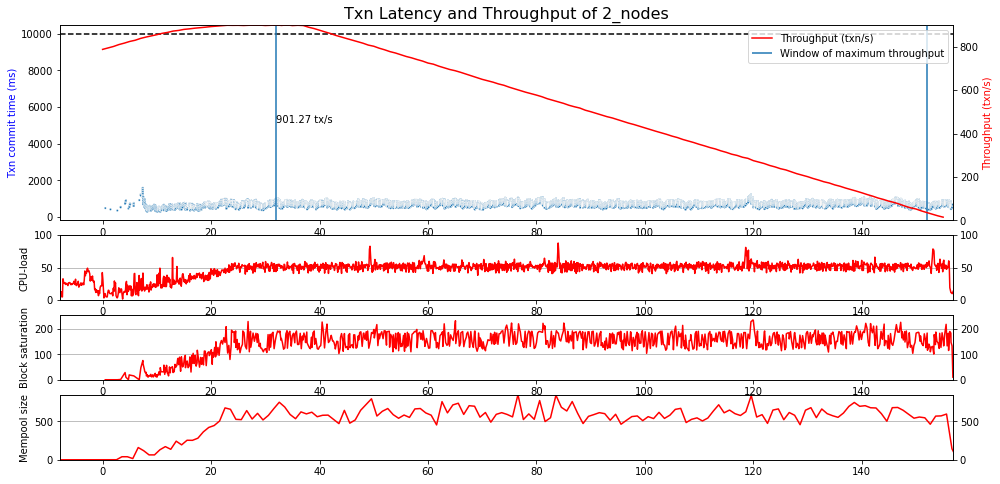

In [15]:
# Print the result graphs for experiment5
#directory_exp5 = '/home/jeanpierre/libra2/libra2/experiments_logs/Experiment_vary_sending_interval/2_nodes/'
directory_exp5 = '/home/jeanpierre/LibraMetrics/containersMetricsFiles/Experiment_compare_swarm_and_simulator/test_vary_timeout/'
time_window = 120

nr_nodes = []
nr_nodes_part1 = []
nr_nodes_part2 = []

for x_nodes in os.listdir(directory_exp5):
    nr_nodes_part1.append(int(x_nodes.split('_')[0]))
    nr_nodes_part2.append(str(x_nodes.split('_')[1]))

nr_nodes_part1.sort()
for node_nr in range(len(nr_nodes_part1)):
    nr_nodes.append(str(nr_nodes_part1[node_nr]) + "_" + nr_nodes_part2[node_nr])

max_throughput_experiment5 = []
for x_nodes in nr_nodes:
    for experiment_folder in os.listdir(directory_exp5 + x_nodes):
        print(x_nodes + ' = ' + experiment_folder)
        directory_tmp = directory_exp5 + x_nodes + "/" + experiment_folder + "/"
        blockstore_dataframe, block_saturation = get_blockstore_dataframe_and_block_saturation(directory_tmp)
        _, max_throughput_tmp = plot_throughput_commit_times(blockstore_dataframe, directory_tmp, block_saturation, time_window, "Txn Latency and Throughput of " + x_nodes)
        max_throughput_experiment5.append(x_nodes + "=" + str(int(max_throughput_tmp)))
        
        with pd.option_context('display.max_rows', None, 'display.max_columns', None):  # more options can be specified also
            block_saturation['timestamp_diff'] = block_saturation.diff(axis=0)['timestamp']
            #block_saturation = block_saturation[block_saturation['saturation'] == 1000]
            #print(block_saturation.describe())
            #print()
            #print(block_saturation)
            
        #break

2_nodes = 2021_01_05__21_35_36
3_nodes = 2021_01_05__21_48_35
4_nodes = 2021_01_05__17_43_00
5_nodes = 2021_01_05__22_40_35
6_nodes = 2021_01_05__23_00_05
7_nodes = 2021_01_05__23_39_05
8_nodes = 2021_01_05__23_52_05
9_nodes = 2021_01_06__00_31_06
10_nodes = 2021_01_06__00_44_06
11_nodes = 2021_01_06__01_10_06
12_nodes = 2021_01_06__01_42_36
13_nodes = 2021_01_06__02_02_06
14_nodes = 2021_01_05__18_48_02
15_nodes = 2021_01_05__18_54_32
16_nodes = 2021_01_05__19_01_03
Performance: (txns/s)
2_nodes=1544
3_nodes=1457
4_nodes=1390
5_nodes=1300
6_nodes=1244
7_nodes=1201
8_nodes=1127
9_nodes=1083
10_nodes=1033
11_nodes=1019
12_nodes=974
13_nodes=936
14_nodes=897
15_nodes=875
16_nodes=852
Max mempool size:
2_nodes=17960
3_nodes=17440
4_nodes=15588
5_nodes=18548
6_nodes=16080
7_nodes=21752
8_nodes=14048
9_nodes=16892
10_nodes=14204
11_nodes=21472
12_nodes=15848
13_nodes=13344
14_nodes=16144
15_nodes=12445
16_nodes=17338
Max throughput start times:
[54, 39, 41, 54, 53, 50, 62, 84, 103, 62, 76, 

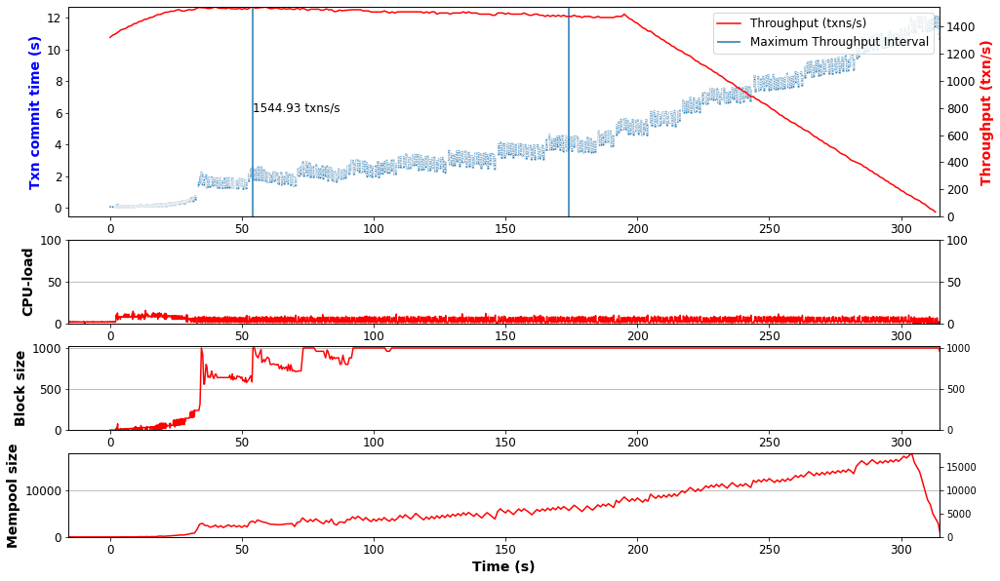

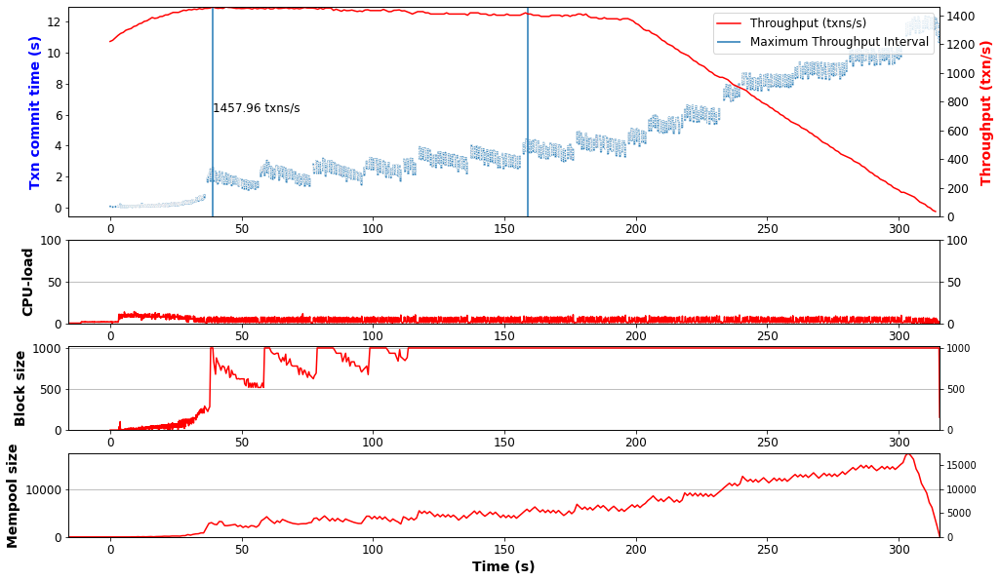

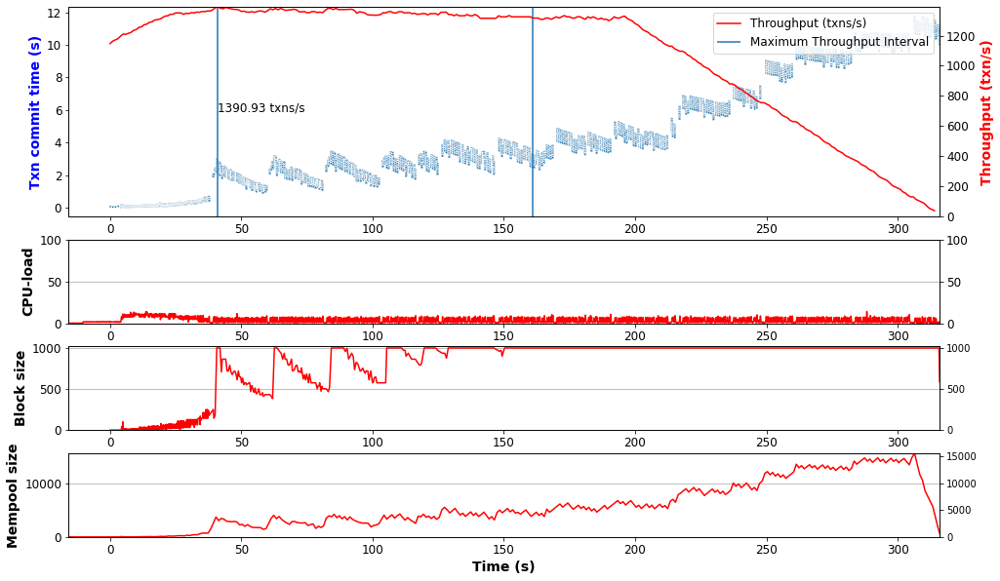

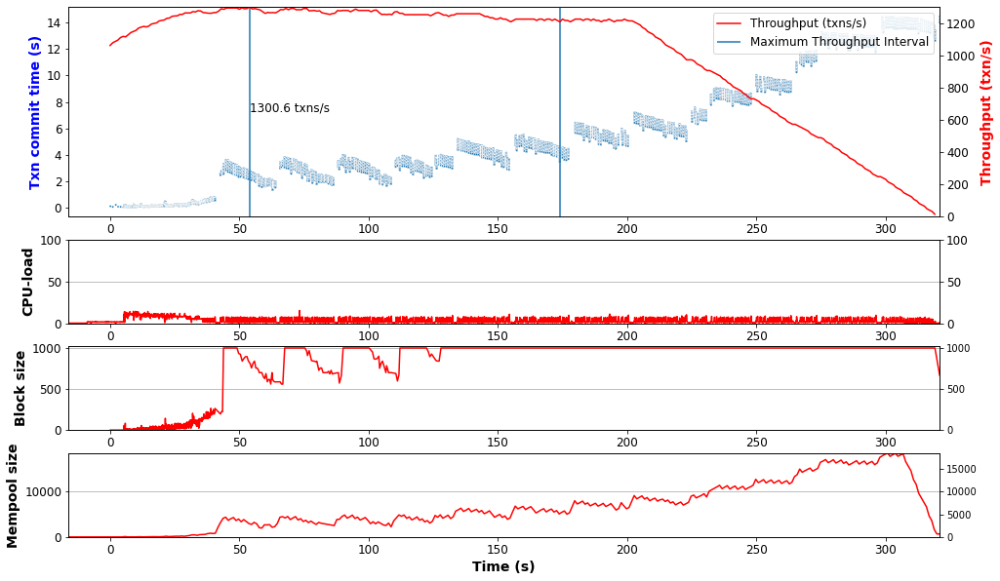

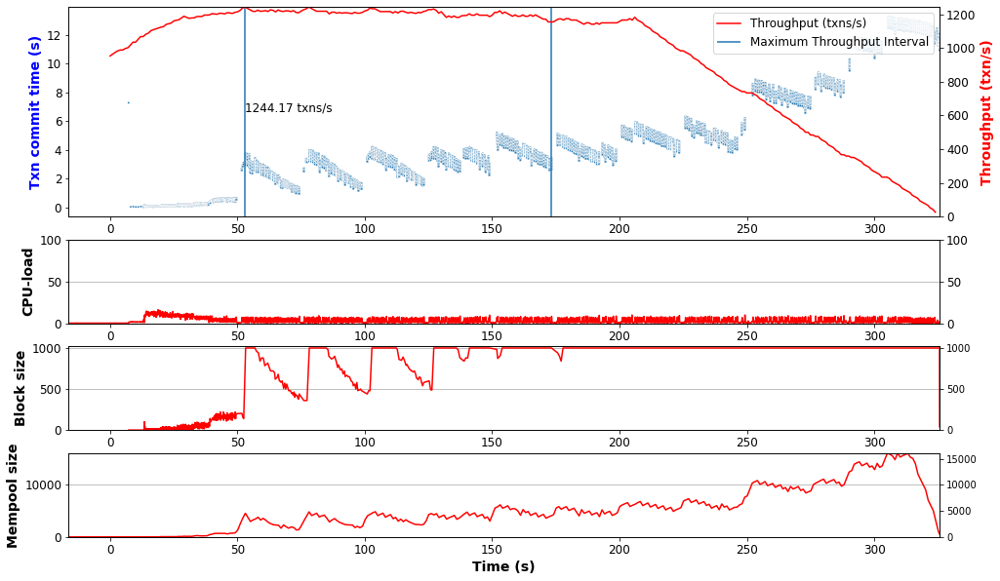

...

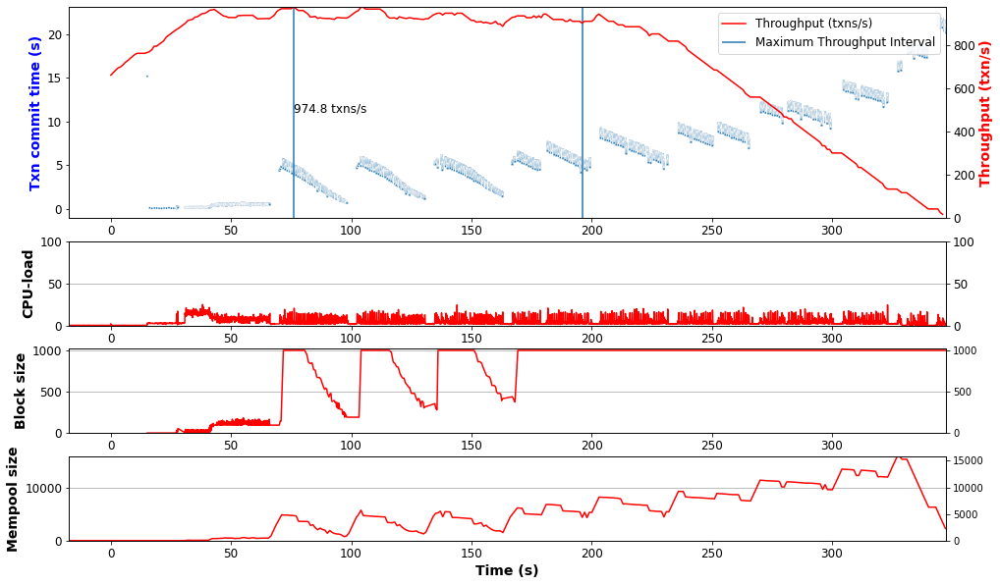

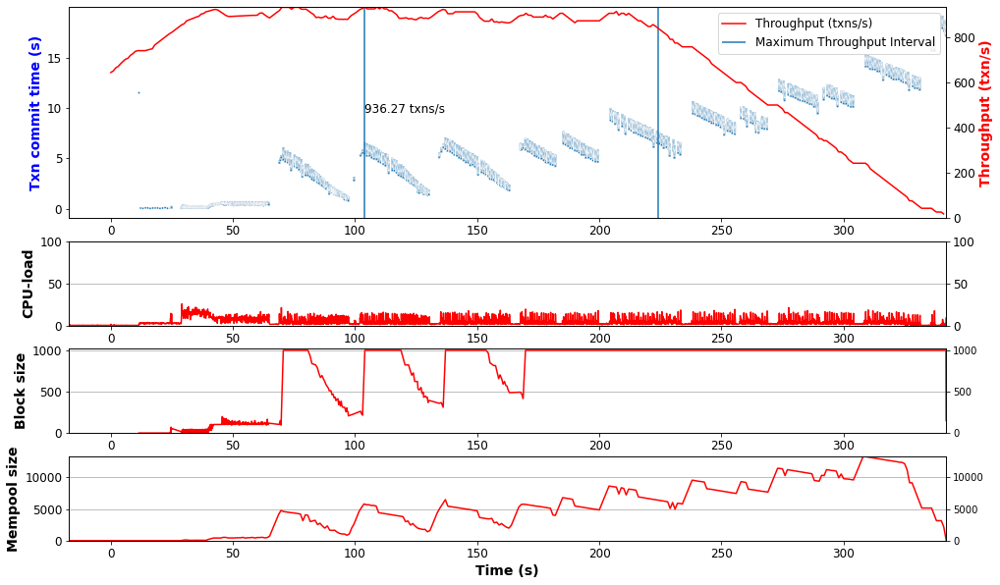

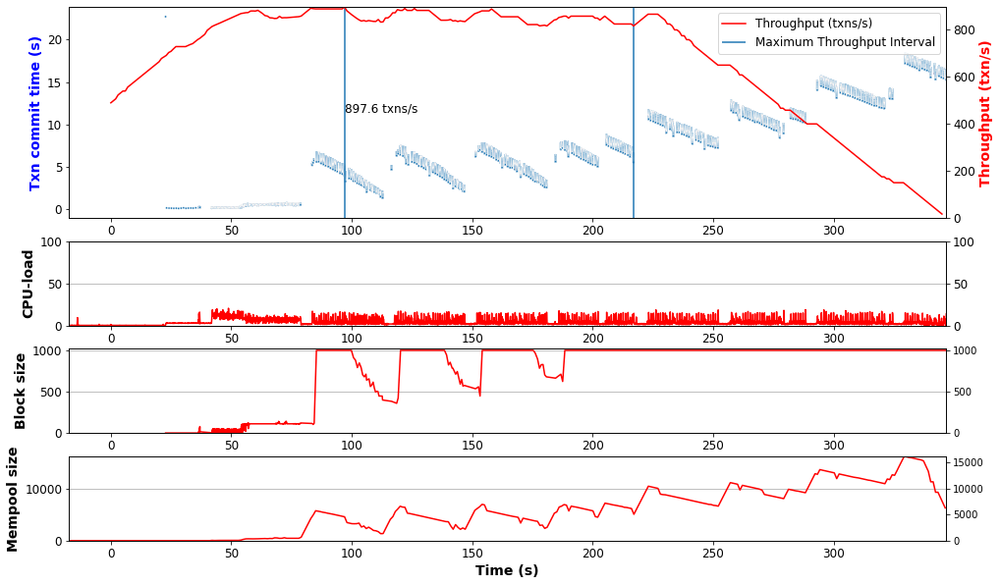

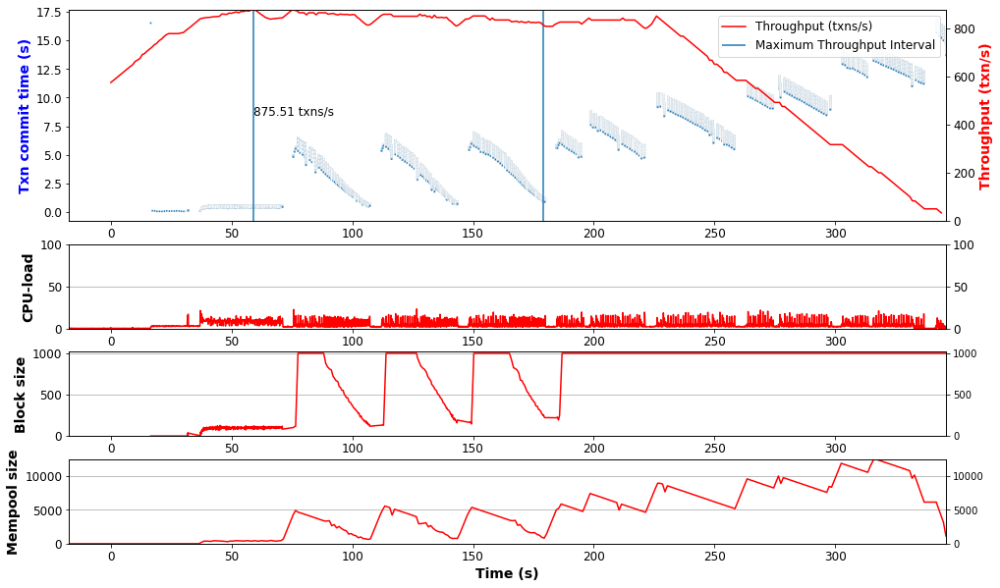

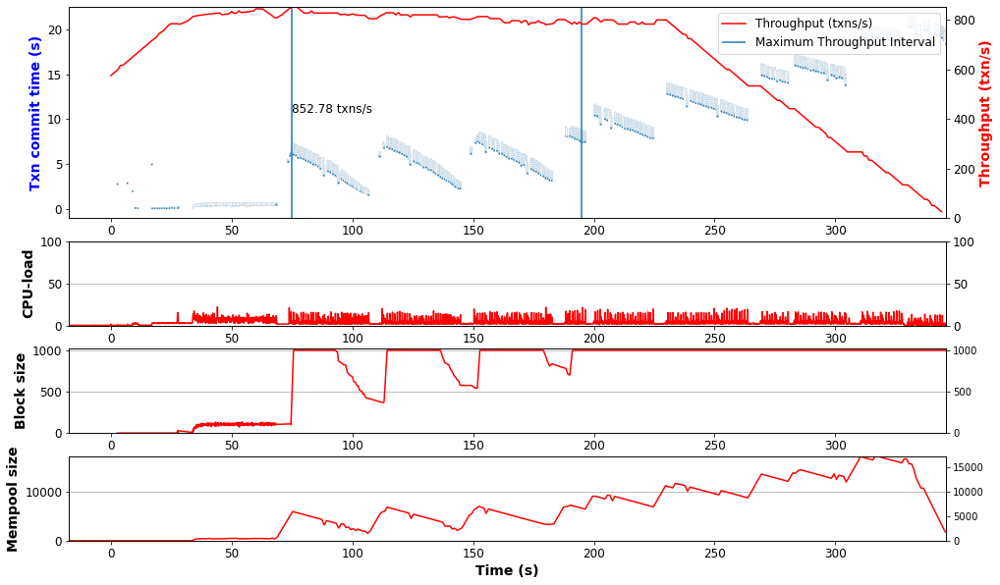

In [26]:
# Print the result graphs for experiment1_constant
#directory_exp1_constant = '/home/jeanpierre/LibraMetrics/containersMetricsFiles/Experiment_test/'
#directory_exp1_constant = "/home/jeanpierre/libra2/libra2/experiments_logs/Experiment_compare_swarm_and_simulator/Experiment3/attempt2/"
directory_exp1_constant = "/home/jeanpierre/libra2/libra2/experiments_logs/hpc_logs/attempt10-8machines/"
#directory_exp1_constant = "/home/jeanpierre/libra2/libra2/experiments_logs/hpc_logs/compare2_to_10_machines_hpc/2machines/"

time_window = 120 #120

nr_nodes = []
nr_nodes_part1 = []
nr_nodes_part2 = []

for x_nodes in os.listdir(directory_exp1_constant):
    if x_nodes.find("_") != -1:
        nr_nodes_part1.append(int(x_nodes.split('_')[0]))
        nr_nodes_part2.append(str(x_nodes.split('_')[1]))

nr_nodes_part1.sort()
for node_nr in range(len(nr_nodes_part1)):
    nr_nodes.append(str(nr_nodes_part1[node_nr]) + "_" + nr_nodes_part2[node_nr])

#nr_nodes = nr_nodes[:1]
    
max_throughput_experiment1_constant = []
max_mempool_size = []
max_throughput_start_times = []
for x_nodes in nr_nodes:
    for experiment_folder in os.listdir(directory_exp1_constant + x_nodes):
        print(x_nodes + ' = ' + experiment_folder)
        directory_tmp = directory_exp1_constant + x_nodes + "/" + experiment_folder + "/"
        max_mempool_size.append(max(get_mempool_size_dataframe(directory_tmp)['size']))
        blockstore_dataframe, block_saturation = get_blockstore_dataframe_and_block_saturation(directory_tmp)
        max_throughput_time, max_throughput_tmp = plot_throughput_commit_times(blockstore_dataframe, directory_tmp, block_saturation, time_window, "Txn Latency and Throughput of " + x_nodes)
        max_throughput_experiment1_constant.append(x_nodes + "=" + str(int(max_throughput_tmp)))
        max_throughput_start_times.append(max_throughput_time)
        break

print("Performance: (txns/s)")
for line in max_throughput_experiment1_constant:    
    print(line)
    
print("Max mempool size:")
for index, line in enumerate(max_mempool_size):    
    print(str(nr_nodes[index]) + "=" + str(line))
    
print("Max throughput start times:")
print(max_throughput_start_times)    
    
#with pd.option_context('display.max_rows', None, 'display.max_columns', None):  # more options can be specified also
#    block_saturation['timestamp_diff'] = block_saturation.diff(axis=0)['timestamp']
#    block_saturation = block_saturation[block_saturation['saturation'] == 1000]
#    print(block_saturation.describe())
#    print()
#    print(block_saturation)

In [29]:
def get_max_throughput(result, time_window):  
    #Find the maximum throughput
    max_throughput = 0
    for x in range(int(max(result['txn_rel_commit_time']))):
        rows = result.loc[(result['txn_rel_commit_time'] >= x) & (result['txn_rel_commit_time'] < x+time_window)]
        if len(rows) > max_throughput:
            max_throughput = len(rows)
            
    return max_throughput / time_window

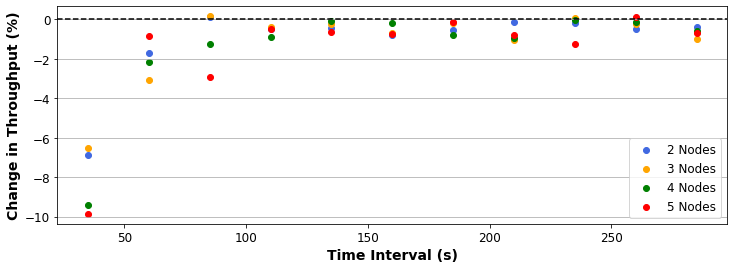

In [146]:
#Finding the stability interval duration
#directory_exp1_constant = "/home/jeanpierre/libra2/libra2/experiments_logs/hpc_logs/attempt5/"
directory_exp1_constant = "/home/jeanpierre/libra2/libra2/experiments_logs/hpc_logs/attempt10-8machines/"

nr_nodes = []
nr_nodes_part1 = []
nr_nodes_part2 = []

for x_nodes in os.listdir(directory_exp1_constant):
    if x_nodes.find("_") != -1:
        nr_nodes_part1.append(int(x_nodes.split('_')[0]))
        nr_nodes_part2.append(str(x_nodes.split('_')[1]))

nr_nodes_part1.sort()
for node_nr in range(len(nr_nodes_part1)):
    nr_nodes.append(str(nr_nodes_part1[node_nr]) + "_" + nr_nodes_part2[node_nr])
    
nr_nodes = nr_nodes[:4]

#time_window_list = [30, 60, 90, 120, 150, 180, 210, 240, 270, 300, 330, 360]
#time_window_list = np.arange(10, 300, 25)
#max_throughput_df = pd.DataFrame()
#max_throughput_df['time_window(s)'] = time_window_list
#for x_nodes in nr_nodes:
#    for experiment_folder in os.listdir(directory_exp1_constant + x_nodes):
#        directory_tmp = directory_exp1_constant + x_nodes + "/" + experiment_folder + "/"
#        blockstore_df = get_blockstore_dataframe(directory_tmp)
#        max_throughput_tmp = []
#        
#        for time_window in time_window_list:
#            max_throughput_tmp.append(get_max_throughput(blockstore_df, time_window))
#            
#        max_throughput_df[x_nodes] = max_throughput_tmp
#        break

#max_throughput_df = np.around(max_throughput_df, 1)
#max_throughput_df_pct_change = max_throughput_df.pct_change() * 100
#print(max_throughput_df)
#print(max_throughput_df_pct_change)

fig, ax = plt.subplots(1, 1, figsize=(12,4))
#ax.set_title("Approximating the Time Interval")
ax.set_xlabel('Time Interval (s)', fontweight='bold')
ax.set_ylabel('Change in Throughput (%)', fontweight='bold')
for i, node in enumerate(nr_nodes):
    label_name = node.replace("_", " ").replace("nodes", "Nodes")
    ax.scatter(max_throughput_df['time_window(s)'], max_throughput_df_pct_change[node], label=label_name);
ax.axhline(y=0, c='black', ls='--')
ax.grid(axis='y')

ax.xaxis.label.set_size(14)
ax.yaxis.label.set_size(14)
ax.xaxis.set_tick_params(labelsize=12)
ax.yaxis.set_tick_params(labelsize=12)

ax.legend(fontsize=12);

[1126. 1140. 1130. 1125. 1139. 1136. 1130. 1136. 1092. 1133.]
[974. 983. 986. 999. 967. 981. 990. 983. 950. 958.]
[788. 852. 809. 808. 825. 817. 807. 800. 808. 783.]
[691. 701. 698. 727. 706. 710. 713. 700. 667. 664.]
[640. 670. 654. 643. 628. 575. 592. 575. 575. 575.]
[550. 565. 601. 607. 582. 517. 517. 508. 517. 508.]
[503. 500. 494. 512. 501. 495. 483. 475. 467. 467.]
[468. 472. 471. 458. 459. 442. 425. 425. 417. 433.]
[417. 436. 437. 442. 436. 434. 416. 416. 411. 403.]


Text(78.0, 0.5, '#Nodes')

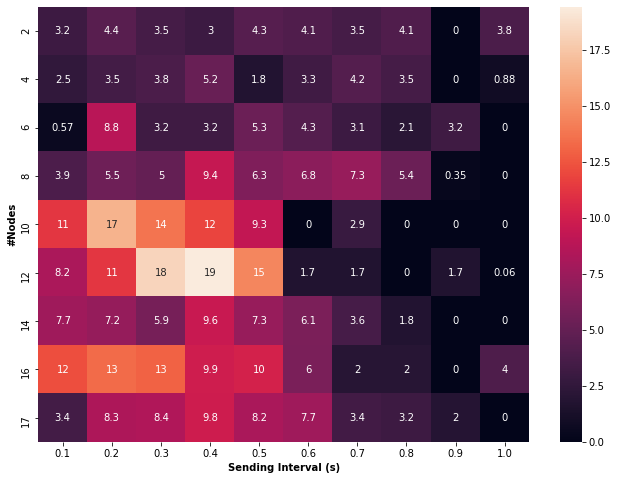

In [52]:
#Finding the optimal sending_interval_duration
directory_exp1_constant = "/home/jeanpierre/libra2/libra2/experiments_logs/Experiment_vary_sending_interval_attempt4/"
time_window = 120

nr_nodes = []
nr_nodes_part1 = []
nr_nodes_part2 = []

interval_duration = []
interval_duration_part1 = []
interval_duration_part2 = []

for x_nodes in os.listdir(directory_exp1_constant):
    nr_nodes_part1.append(int(x_nodes.split('_')[0]))
    nr_nodes_part2.append(str(x_nodes.split('_')[1]))

nr_nodes_part1.sort()
for node_nr in range(len(nr_nodes_part1)):
    nr_nodes.append(str(nr_nodes_part1[node_nr]) + "_" + nr_nodes_part2[node_nr])

#PART2
    
for x_interval in os.listdir(directory_exp1_constant + nr_nodes[0]):
    interval_duration_part1.append(float(x_interval.split('_')[0]))
    interval_duration_part2.append(str(x_interval.split('_')[1]))
    
interval_duration_part1.sort()
for interval_nr in range(len(interval_duration_part1)):
    interval_duration.append(str(interval_duration_part1[interval_nr]) + "_" + interval_duration_part2[interval_nr])

throughput_results_2d_array = []

for x_nodes in nr_nodes:
    max_throughput_row = []
    for x_interval in interval_duration:
        for experiment_folder in os.listdir(directory_exp1_constant + x_nodes + "/" + x_interval):
            directory_tmp = directory_exp1_constant + x_nodes + "/" + x_interval + "/" + experiment_folder + "/"
            blockstore_df = get_blockstore_dataframe(directory_tmp)
            max_throughput_row.append(get_max_throughput(blockstore_df, time_window))
    
    print(np.round(max_throughput_row, 0))
    min_value = min(max_throughput_row)
    for value in range(len(max_throughput_row)):
        max_throughput_row[value] = round(((max_throughput_row[value]-min_value)/min_value*100), 2)
    
    throughput_results_2d_array.append(max_throughput_row)
    
fig, ax = plt.subplots(1, 1, figsize=(11,8))
sns.heatmap(throughput_results_2d_array, ax=ax, xticklabels=interval_duration_part1, yticklabels=nr_nodes_part1, annot=True);
#ax.set_title("Heatmap showing how Sending_Interval impacts the Transaction_Throughput")
ax.set_xlabel("Sending Interval (s)", fontweight='bold')
ax.set_ylabel("#Nodes", fontweight='bold')

In [10]:
# Calculate the maximum throughput and return the results
def get_max_throughput_array(directory, time_window):
    nr_nodes = []
    nr_nodes_part1 = []
    nr_nodes_part2 = []

    for x_nodes in os.listdir(directory):
        nr_nodes_part1.append(int(x_nodes.split('_')[0]))
        nr_nodes_part2.append(str(x_nodes.split('_')[1]))

    nr_nodes_part1.sort()
    for node_nr in range(len(nr_nodes_part1)):
        nr_nodes.append(str(nr_nodes_part1[node_nr]) + "_" + nr_nodes_part2[node_nr])

    max_throughput = []
    local_values = []
    for x_nodes in nr_nodes:
        for experiment in os.listdir(directory + x_nodes):
            blockstore_df = get_blockstore_dataframe(directory + x_nodes + "/" + experiment + "/")
            local_values.append(get_max_throughput(blockstore_df, time_window))

        max_throughput.append(local_values)
        local_values = []
        
    return nr_nodes_part1, max_throughput

In [31]:
def plot_experiment1():
    nr_nodes_part1, max_throughput = get_max_throughput_array(directory_exp1, time_window)

    plt.figure(figsize=(10, 4))
    ax = sns.barplot(x=nr_nodes_part1, y=max_throughput, color='antiquewhite')
    ax.set(xlabel="Number of Peers", ylabel = "Max Throughput (txns/s)")
    ax.set_title("Maximum throughput with a varying number of peers")
    for i in range(len(nr_nodes_part1)):
        ax.text(i, max_throughput[i], int(round(max_throughput[i], 0)), color='black', ha="center")
    plt.show()
    return max_throughput

In [23]:
def plot_experiment2():
    nr_nodes_part1, max_throughput = get_max_throughput_array(directory_exp2, time_window)

    plt.figure(figsize=(10, 4))
    ax = sns.barplot(x=nr_nodes_part1, y=max_throughput, color='antiquewhite')
    ax.set(xlabel="Ping (ms)", ylabel = "Max Throughput (txns/s)")
    ax.set_title("Maximum throughput with a varying ping")
    for i in range(len(nr_nodes_part1)):
        ax.text(i, max_throughput[i], int(round(max_throughput[i], 0)), color='black', ha="center")
    plt.show()
    return max_throughput

In [24]:
def plot_experiment3():
    nr_nodes_part1, max_throughput = get_max_throughput_array(directory_exp3, time_window)

    plt.figure(figsize=(10, 4))
    ax = sns.barplot(x=nr_nodes_part1, y=max_throughput, color='antiquewhite')
    ax.set(xlabel="Bandwidth (Mbit/s)", ylabel = "Max Throughput (txns/s)")
    ax.set_title("Maximum throughput with a varying bandwidth")
    for i in range(len(nr_nodes_part1)):
        ax.text(i, max_throughput[i], int(round(max_throughput[i], 0)), color='black', ha="center")
    plt.show()
    return max_throughput

In [25]:
def plot_experiment4():
    nr_nodes_part1, max_throughput = get_max_throughput_array(directory_exp4, time_window)

    plt.figure(figsize=(10, 4))
    ax = sns.barplot(x=nr_nodes_part1, y=max_throughput, color='antiquewhite')
    ax.set(xlabel="Blocksize (txns)", ylabel = "Max Throughput (txns/s)")
    ax.set_title("Maximum throughput with a varying blocksize")
    for i in range(len(nr_nodes_part1)):
        ax.text(i, max_throughput[i], int(round(max_throughput[i], 0)), color='black', ha="center")
    plt.show()
    return max_throughput

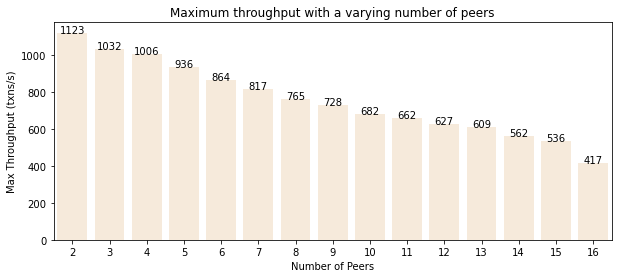

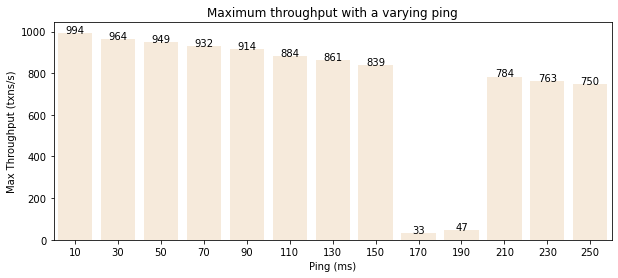

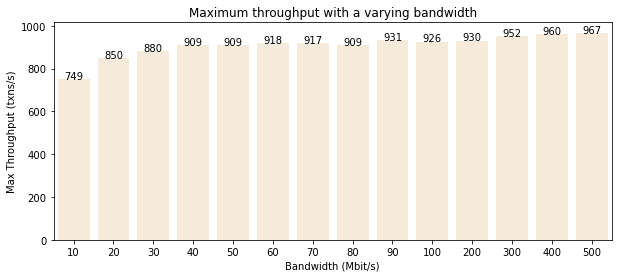

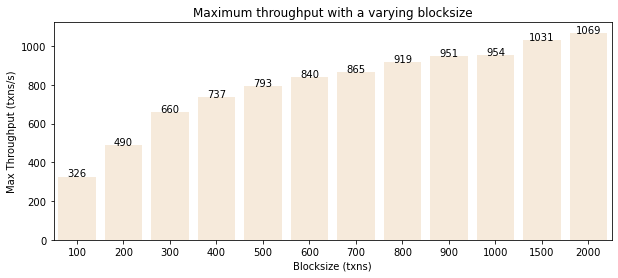

In [17]:
# Plot the results of experiment 1,2 and 3 in a barplot
directory_exp1 = '/home/jeanpierre/libra2/libra2/experiments_logs/Experiment1_constant/attempt4/'
directory_exp2 = '/home/jeanpierre/libra2/libra2/experiments_logs/Experiment2_constant/attempt4/'
directory_exp3 = '/home/jeanpierre/libra2/libra2/experiments_logs/Experiment3_constant/attempt4/'
directory_exp4 = '/home/jeanpierre/libra2/libra2/experiments_logs/Experiment4_constant/attempt4/'

time_window = 120
max_throughput_exp1_libra = plot_experiment1()
max_throughput_exp2_libra = plot_experiment2()
max_throughput_exp3_libra = plot_experiment3()
max_throughput_exp4_libra = plot_experiment4()

In [18]:
for result in max_throughput_experiment1:
    print(result)

NameError: name 'max_throughput_experiment1' is not defined

In [27]:
for result in max_throughput_experiment2:
    print(result)

10_delay=900
30_delay=866
50_delay=850
70_delay=850
90_delay=825
110_delay=792
130_delay=777
150_delay=766
200_delay=737
250_delay=707
300_delay=658
400_delay=606
500_delay=566


In [28]:
for result in max_throughput_experiment3:
    print(result)

5_bandwidth=219
10_bandwidth=483
15_bandwidth=608
20_bandwidth=664
30_bandwidth=724
40_bandwidth=772
50_bandwidth=791
75_bandwidth=793
100_bandwidth=805
200_bandwidth=836
300_bandwidth=843
400_bandwidth=837
500_bandwidth=836


In [29]:
for result in max_throughput_experiment4:
    print(result)

100_blocksize=257
200_blocksize=411
300_blocksize=540
400_blocksize=650
500_blocksize=733
750_blocksize=793
1000_blocksize=866
1500_blocksize=914
2000_blocksize=927
5000_blocksize=1069
10000_blocksize=1001
50000_blocksize=950
100000_blocksize=1066


In [17]:
def libra_sim_comparison_bar_plot(throughputs, x_label, x_ticklabels, plot_title, labels):
    # set width of bar
    barWidth = 1/(len(throughputs) + 1)

    # Set position of bar on X axis
    x_pos = []
    for i in range(len(throughputs)):
        r1 = np.arange(len(throughputs[0]))
        x_pos.append([x + (barWidth*i) for x in r1])
    
    #r1 = np.arange(len(bars1))
    #r2 = [x + barWidth for x in r1]
    
    fig, ax = plt.subplots(1, 1, figsize=(12,4))
    ax.set_title(plot_title)
    
    # Calculate the mean and standard_error of the data
    means = []
    std_errors = []
    for throughput in throughputs:
        local_means = []
        local_std_errors = []
        for experiment in throughput:
            local_means.append(np.mean(experiment))
            local_std_errors.append(np.std(experiment, ddof=1) / np.sqrt(len(experiment)))
        means.append(local_means)
        std_errors.append(local_std_errors)
    
    #For calculating percentage
    mean_swarm = []
    std_error_swarm = []
    for experiment in throughputs[0]:
        mean_swarm.append(np.mean(experiment))
        std_error_swarm.append(np.std(experiment, ddof=1) / np.sqrt(len(experiment)))
        
    mean_simulator = []
    std_error_simulator = []
    for experiment in throughputs[1]:
        mean_simulator.append(np.mean(experiment))
        std_error_simulator.append(np.std(experiment, ddof=1) / np.sqrt(len(experiment)))
        
    # ONLY FOR FINAL PLOT
    #mean_simulator_final = []
    #std_error_simulator_final = []
    #for experiment in throughputs[3]:
    #    mean_simulator_final.append(np.mean(experiment))
    #    std_error_simulator_final.append(np.std(experiment, ddof=1) / np.sqrt(len(experiment)))
        
    # Make the plot
    for i in range(len(throughputs)):
        if i == 0:
            color = '#7f6d5f'
        else:
            color = '#557f2d'
        ax.bar(x_pos[i], means[i], yerr=std_errors[i], width=barWidth, edgecolor='white', label=labels[i])
    
    #ax.bar(r1, mean_swarm, yerr=std_error_swarm, color='#7f6d5f', width=barWidth, edgecolor='white', label='Libra Swarm')
    #ax.bar(r2, mean_simulator, yerr=std_error_simulator, color='#557f2d', width=barWidth, edgecolor='white', label='Simulator')
    
    # Add xticks on the middle of the group bars
    ax.set_xlabel(x_label, fontweight='bold')
    ax.set_xticks([r + barWidth for r in range(len(throughputs[0]))])
    ax.set_xticklabels(x_ticklabels)
    ax.set_ylabel('Throughput (txns/s)', fontweight='bold')
    #ax.set_ylabel('Transactie Volume (txns/s)', fontweight='bold')
    ax.xaxis.label.set_size(14)
    ax.yaxis.label.set_size(14)
    ax.xaxis.set_tick_params(labelsize=12)
    ax.yaxis.set_tick_params(labelsize=12)
    
    # Add percentage difference
    for i in range(len(mean_swarm)):
        #max_throughput_label = max(mean_swarm[i], mean_simulator[i])
        #max_throughput_label = mean_simulator_final[i]
        #Percentage
        #Azure
        #ax.text(i + 0.66, max_throughput_label + max_throughput_label*0.03, str(round((mean_simulator[i] - mean_swarm[i])/mean_swarm[i]*100)) + "%", color='black', fontsize=12, ha="center")
        #HPC
        #ax.text(i + 0.55, max_throughput_label + max_throughput_label*0.13, str(round((mean_simulator[i] - mean_swarm[i])/mean_swarm[i]*100)) + "%", color='black', fontsize=12, ha="center")

        #Absosulte values
        ax.text(i + 0.10, mean_swarm[i] + mean_swarm[i]*0.03, str(round((mean_swarm[i]))), color='black', fontsize=12, ha="center")
        ax.text(i + 0.50, mean_simulator[i] + mean_simulator[i]*0.03, str(round((mean_simulator[i]))), color='black', fontsize=12, ha="center")
        
    # Create legend
    #maximum_throughput = max(max(mean_swarm), max(mean_simulator)) + 0.1 * max(max(mean_swarm), max(mean_simulator))
    max_throughput = 0
    for mean in means:
        max_tps = max(mean) + 0.1 * max(mean)
        if max_tps > max_throughput:
            max_throughput = max_tps
    
    ax01 = ax.twinx()
    ax01.xaxis.label.set_size(14)
    ax01.yaxis.label.set_size(14)
    ax01.xaxis.set_tick_params(labelsize=12)
    ax01.yaxis.set_tick_params(labelsize=12)
    ax.set_ylim(0, max_throughput + 0.19*max_throughput)
    ax01.set_ylim(0, max_throughput + 0.19*max_throughput)
    ax.grid(axis='y')
    ax.legend(fontsize=10)

In [12]:
def simulator_bar_plot(X_data, Y_data, X_label, plot_title):

    fig, ax = plt.subplots(1, 1, figsize=(10,4))
    ax.set_title(plot_title)

    # Make the plot
    ax.plot(X_data, Y_data, color='#7f6d5f', label='Simulator')
    ax.set_xlabel(X_label, fontweight='bold')
    ax.set_ylabel('Throughput (txns/s)', fontweight='bold')

    ax.grid(axis='y')
    ax.legend()
    return ax

In [13]:
def get_sorted_label_names(directory):
    filenames = []
    for filename in os.listdir(directory):
        filenames.append(int(filename.split('_')[0]))

    filenames.sort()
    return filenames

In [14]:
def get_max_throughput_for_libra_sim(base_dir, label_name):

    max_throughput_array = []

    for experiment in get_sorted_label_names(base_dir):
        
        local_throughput_array = []
        data_dir = os.listdir(base_dir + str(experiment) + label_name)[0]
        for run_nr in os.listdir(base_dir + str(experiment) + label_name + data_dir):
            with open(base_dir + str(experiment) + label_name + data_dir + '/' + run_nr + '/' + 'output_run_info_data.txt') as fp:
                line = fp.readline()
                while line:
                    line = fp.readline()
                    if 'transaction_throughput_avg' in line:
                        throughput_avg = line.split('=')[1]
                        local_throughput_array.append(int(float(throughput_avg.rstrip("\n"))))
                        
        max_throughput_array.append(local_throughput_array)
        local_throughput_array = []
                    
    return max_throughput_array

In [15]:
# Plot residual plot
def plot_residuals(model, throughputs, labels, x_labels, x_axis_name):
    x_labels = [str(int) for int in x_labels]
    
    fig, ax0 = plt.subplots(1,1,figsize=(12,2))

    y_libra = [np.mean(i) for i in model]
    ax0.plot(x_labels, np.full(len(y_libra), [0]), '.', label=labels[0])
    for index in range(0, len(throughputs)):
        data = throughputs[index]
        y_model = [np.mean(i) for i in data]
        y_residuals = [a_i - b_i for a_i, b_i in zip(y_model, y_libra)]
        x_model = range(2, len(y_model)+2)
        #ax0.plot(x_labels, y_residuals, '.', label=labels[index+1])
        
        ax0.plot(x_labels, y_residuals, '.', label=labels[index+1])

    ax0.set_xlabel(x_axis_name, fontweight='bold')
    ax0.set_ylabel('Residuals', fontweight='bold')
    ax0.grid(axis='y')
    ax0.xaxis.label.set_size(14)
    ax0.yaxis.label.set_size(14)
    ax0.xaxis.set_tick_params(labelsize=12)
    ax0.yaxis.set_tick_params(labelsize=12)
    #ax0.legend(fontsize=12)
    
    #ax0.get_xaxis().set_visible(False)

In [118]:
#Comparison plots for Docker Swarm
#Max throughput arrays for Libra Swarm
time_window = 120
directory_exp1 = '/mnt/DownloadsWindowsShared/Experiment_compare_swarm_and_simulator/Experiment1/attempt1/'
directory_exp2 = '/mnt/DownloadsWindowsShared/Experiment_compare_swarm_and_simulator/Experiment2/attempt1/'
directory_exp3 = '/mnt/DownloadsWindowsShared/Experiment_compare_swarm_and_simulator/Experiment3/attempt1/'
directory_exp4 = '/mnt/DownloadsWindowsShared/Experiment_compare_swarm_and_simulator/Experiment4/attempt1/'
_, max_tps_exp1_libra = get_max_throughput_array(directory_exp1, time_window)
_, max_tps_exp2_libra = get_max_throughput_array(directory_exp2, time_window)
_, max_tps_exp3_libra = get_max_throughput_array(directory_exp3, time_window)
_, max_tps_exp4_libra = get_max_throughput_array(directory_exp4, time_window)

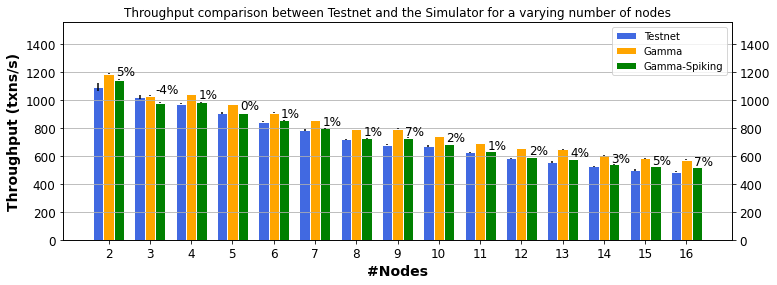

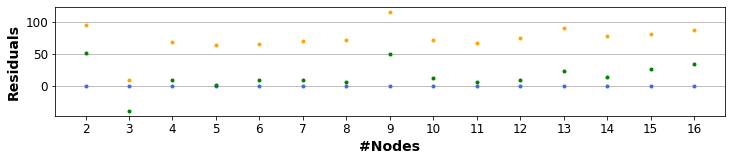

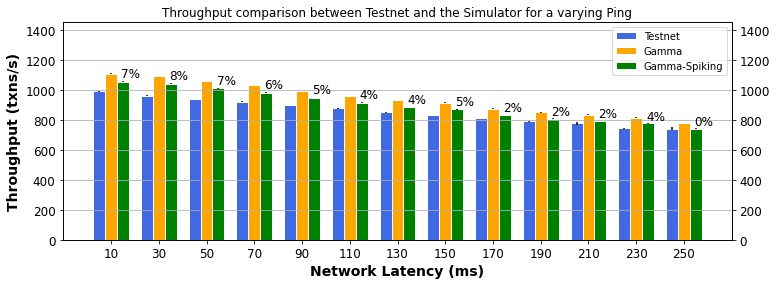

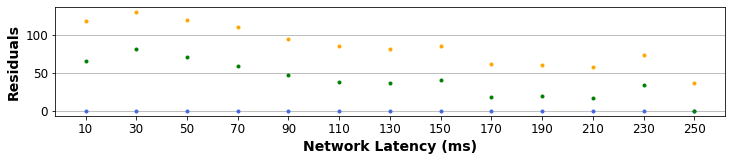

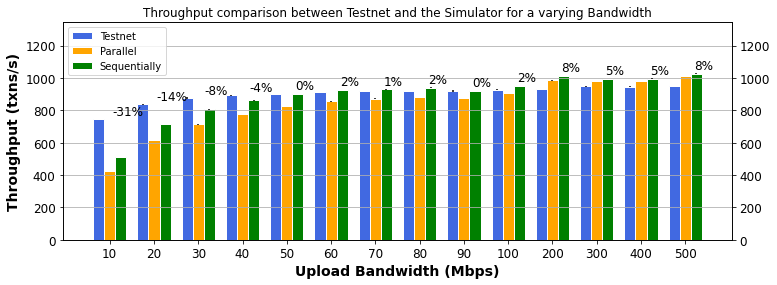

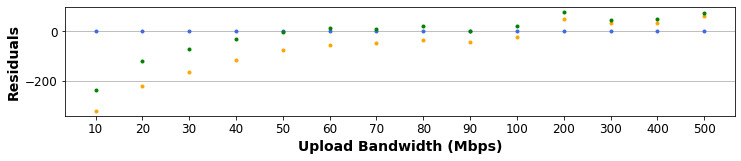

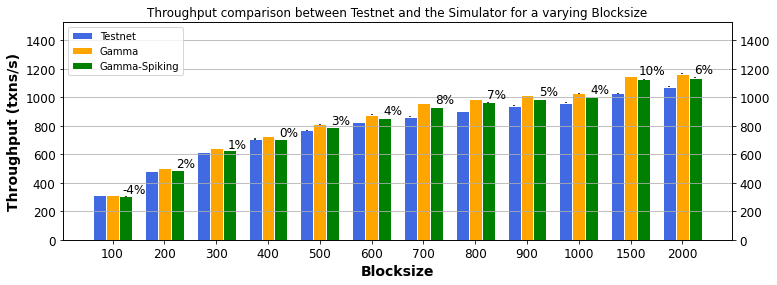

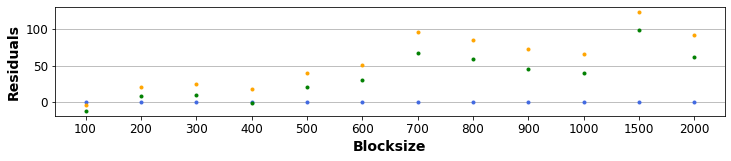

In [149]:
sns.set_palette(sns.color_palette(["royalblue", "orange", "green"]))
#Directories for the Simulator results
#base_dir_exp1 = '/mnt/DownloadsWindowsShared/LibraSimulator-Results/LibraSim-Experiment1-compare/attempt3-noTimeout-fixed_dist/'
dir_exp1 = '/mnt/DownloadsWindowsShared/LibraSimulator-Results/LibraSim-Experiment1-compare/attempt5-noTimeout-fixed_dist-noUpload/'
dir_exp1_spiking = '/mnt/DownloadsWindowsShared/LibraSimulator-Results/LibraSim-Experiment1-compare/attempt5-noTimeout-fixed_dist-noUpload-spiking/'
dir_exp2 = '/mnt/DownloadsWindowsShared/LibraSimulator-Results/LibraSim-Experiment2-compare/attempt5-noTimeout-fixed_dist-noUpload/'
dir_exp2_spiking = '/mnt/DownloadsWindowsShared/LibraSimulator-Results/LibraSim-Experiment2-compare/attempt5-noTimeout-fixed_dist-noUpload-spiking/'
#base_dir_exp3_1 = '/mnt/DownloadsWindowsShared/LibraSimulator-Results/LibraSim-Experiment3-compare/attempt3-noTimeout-fixed_dist/'
dir_exp3_parallel = '/mnt/DownloadsWindowsShared/LibraSimulator-Results/LibraSim-Experiment3-compare/attempt5-noTimeout-fixed_dist-parallel/'
dir_exp3_sequentially = '/mnt/DownloadsWindowsShared/LibraSimulator-Results/LibraSim-Experiment3-compare/attempt5-noTimeout-fixed_dist-sequentially/'
#dir_exp3_sequentially_1500txnsize = '/mnt/DownloadsWindowsShared/LibraSimulator-Results/LibraSim-Experiment3-compare/attempt4-noTimeout-fixed_dist-sequentially-1500txnsize/'

dir_exp4 = '/mnt/DownloadsWindowsShared/LibraSimulator-Results/LibraSim-Experiment4-compare/attempt5-noTimeout-fixed_dist-noUpload/'
dir_exp4_spiking = '/mnt/DownloadsWindowsShared/LibraSimulator-Results/LibraSim-Experiment4-compare/attempt5-noTimeout-fixed_dist-noUpload-spiking/'

# Get the throughputs for the Libra-Simulator
max_tps_exp1_sim = get_max_throughput_for_libra_sim(dir_exp1, '_nodes/')
max_tps_exp1_sim_spiking = get_max_throughput_for_libra_sim(dir_exp1_spiking, '_nodes/')

max_tps_exp2_sim = get_max_throughput_for_libra_sim(dir_exp2, '_delay/')
max_tps_exp2_sim_spiking = get_max_throughput_for_libra_sim(dir_exp2_spiking, '_delay/')

max_tps_exp3_parallel_sim = get_max_throughput_for_libra_sim(dir_exp3_parallel, '_bandwidth/')
max_tps_exp3_sequentially_sim = get_max_throughput_for_libra_sim(dir_exp3_sequentially, '_bandwidth/')
#max_tps_exp3_sequentially_1500txnsize_sim = get_max_throughput_for_libra_sim(dir_exp3_sequentially_1500txnsize, '_bandwidth/')

max_tps_exp4_sim = get_max_throughput_for_libra_sim(dir_exp4, '_blocksize/')
max_tps_exp4_sim_spiking = get_max_throughput_for_libra_sim(dir_exp4_spiking, '_blocksize/')

# Plot and compare with Libra results
libra_sim_comparison_bar_plot([max_tps_exp1_libra, max_tps_exp1_sim, max_tps_exp1_sim_spiking], '#Nodes', get_sorted_label_names(dir_exp1), 'Throughput comparison between Testnet and the Simulator for a varying number of nodes', ['Testnet', 'Gamma', 'Gamma-Spiking'])
plot_residuals(max_tps_exp1_libra, [max_tps_exp1_sim, max_tps_exp1_sim_spiking], ['Testnet', 'Gamma', 'Gamma-Spiking'], get_sorted_label_names(dir_exp1), '#Nodes')

libra_sim_comparison_bar_plot([max_tps_exp2_libra, max_tps_exp2_sim, max_tps_exp2_sim_spiking], 'Network Latency (ms)', get_sorted_label_names(dir_exp2), 'Throughput comparison between Testnet and the Simulator for a varying Ping', ['Testnet', 'Gamma', 'Gamma-Spiking'])
plot_residuals(max_tps_exp2_libra, [max_tps_exp2_sim, max_tps_exp2_sim_spiking], ['Testnet', 'Gamma', 'Gamma-Spiking'], get_sorted_label_names(dir_exp2), 'Network Latency (ms)')

libra_sim_comparison_bar_plot([max_tps_exp3_libra, max_tps_exp3_parallel_sim, max_tps_exp3_sequentially_sim], 'Upload Bandwidth (Mbps)', get_sorted_label_names(dir_exp3_parallel), 'Throughput comparison between Testnet and the Simulator for a varying Bandwidth', ['Testnet', 'Parallel', 'Sequentially', 'Parallel-188Bytes'])
plot_residuals(max_tps_exp3_libra, [max_tps_exp3_parallel_sim, max_tps_exp3_sequentially_sim], ['Testnet', 'Parallel', 'Sequentially'], get_sorted_label_names(dir_exp3_parallel), 'Upload Bandwidth (Mbps)')

libra_sim_comparison_bar_plot([max_tps_exp4_libra, max_tps_exp4_sim, max_tps_exp4_sim_spiking], 'Blocksize', get_sorted_label_names(dir_exp4), 'Throughput comparison between Testnet and the Simulator for a varying Blocksize', ['Testnet', 'Gamma', 'Gamma-Spiking'])
plot_residuals(max_tps_exp4_libra, [max_tps_exp4_sim, max_tps_exp4_sim_spiking], ['Testnet', 'Gamma', 'Gamma-Spiking'], get_sorted_label_names(dir_exp4), 'Blocksize')

#libra_sim_comparison_bar_plot([max_throughput_exp1_libra, max_throughput_exp1_sim], '#Nodes', get_sorted_label_names(base_dir_exp1), 'Transactie Volume tussen Libra en de Simulator voor een gevarieerd aantal Nodes', ['Libra', 'Simulator'])
#libra_sim_comparison_bar_plot([max_throughput_exp2_libra, max_throughput_exp2_sim], 'Internetvertragingstijd (ms)', get_sorted_label_names(base_dir_exp2), 'Transactie Volume tussen Libra en de Simulator voor een oplopende Internetvertragingstijd', ['Libra', 'Simulator'])
#libra_sim_comparison_bar_plot([max_throughput_exp3_libra, max_throughput_exp3_1_sim, max_throughput_exp3_2_sim], 'Internetsnelheid  (Mbps)', get_sorted_label_names(base_dir_exp3_1), 'Transactie Volume tussen Libra en de Simulator voor een oplopende Internetsnelheid', ['Libra', 'Simulator-Parallel', 'Simulator-Sequentially'])
#libra_sim_comparison_bar_plot([max_throughput_exp4_libra, max_throughput_exp4_sim], 'Blokgrootte', get_sorted_label_names(base_dir_exp4), 'Transactie Volume tussen Libra en de Simulator voor een gevarieerde Blokgrootte', ['Libra', 'Simulator'])

In [71]:
#Comparison plots for HPC
#Max throughput arrays for Libra Swarm
time_window = 120 #120
directory_exp1 = '/home/jeanpierre/Desktop/DownloadsWindowsShared/Experiment_compare_swarm_and_simulator/hpc_logs/attempt10-8machines/'

_, max_throughput_hpc_libra = get_max_throughput_array(directory_exp1, time_window)

In [65]:
print(max_throughput_hpc_libra)

[[1557.3083333333334, 1547.4166666666667, 1555.9083333333333, 1553.2, 1544.9333333333334], [1446.2, 1448.3, 1457.9583333333333, 1452.9333333333334, 1462.3833333333334], [1390.9333333333334, 1388.2666666666667, 1387.4, 1385.7083333333333, 1388.0], [1300.6333333333334, 1285.8333333333333, 1300.6, 1302.7333333333333, 1301.6666666666667], [1243.1666666666667, 1244.1666666666667, 1064.6583333333333, 1245.0, 1244.3333333333333], [1201.8, 1200.4, 1197.0583333333334, 1201.3333333333333, 1201.1], [1123.4916666666666, 1127.4666666666667, 1118.7, 1121.9333333333334, 1123.6], [1077.5, 1084.7333333333333, 1081.4666666666667, 1083.3333333333333, 1074.0333333333333], [1025.6666666666667, 1033.6333333333334, 1032.8333333333333, 1031.5583333333334, 1018.4916666666667], [1021.5333333333333, 1019.1833333333333, 1032.8, 1026.1333333333334, 1016.5333333333333], [974.7333333333333, 981.1333333333333, 974.8, 967.575, 970.1333333333333], [930.2666666666667, 936.2666666666667, 933.4666666666667], [897.6], [875

/home/jeanpierre/anaconda3/lib/python3.8/site-packages/numpy/core/_methods.py:233: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/jeanpierre/anaconda3/lib/python3.8/site-packages/numpy/core/_methods.py:226: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


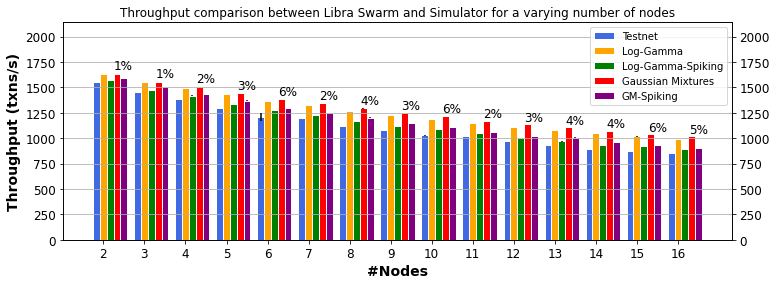

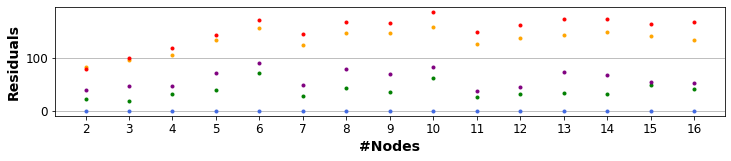

In [164]:
#Directories for the Simulator results
sns.set_palette(sns.color_palette(["royalblue", "orange", "green", "red", "purple"]))
base_dir_exp1 = '/mnt/DownloadsWindowsShared/LibraSimulator-Results/LibraSim-Experiment1-compare/attempt16-noTimeout-hpc-loggamma-8machines/'
base_dir_exp2 = '/mnt/DownloadsWindowsShared/LibraSimulator-Results/LibraSim-Experiment1-compare/attempt1-noTimeout-hpc-loggamma-spiking-8machines/'
base_dir_exp3 = '/mnt/DownloadsWindowsShared/LibraSimulator-Results/LibraSim-Experiment1-compare/attempt15-noTimeout-hpc-gaussianmixture-8machines/'
base_dir_exp4 = '/mnt/DownloadsWindowsShared/LibraSimulator-Results/LibraSim-Experiment1-compare/attempt2-noTimeout-hpc-gaussianmixture-spiking-8machines/'

# Get the throughputs for the Libra-Simulator
max_tps_1 = get_max_throughput_for_libra_sim(base_dir_exp1, '_nodes/')
max_tps_2 = get_max_throughput_for_libra_sim(base_dir_exp2, '_nodes/')
max_tps_3 = get_max_throughput_for_libra_sim(base_dir_exp3, '_nodes/')
max_tps_4 = get_max_throughput_for_libra_sim(base_dir_exp4, '_nodes/')
throughputs = [max_throughput_hpc_libra, max_tps_1, max_tps_2, max_tps_3, max_tps_4]

# Plot and compare with Libra results
labels = ['Testnet', 'Log-Gamma', 'Log-Gamma-Spiking', 'Gaussian Mixtures', 'GM-Spiking']
libra_sim_comparison_bar_plot(throughputs, '#Nodes', get_sorted_label_names(base_dir_exp1), 'Throughput comparison between Libra Swarm and Simulator for a varying number of nodes', labels)

# Residual plot
plot_residuals(max_throughput_hpc_libra, throughputs[1:], labels, get_sorted_label_names(base_dir_exp1), '#Nodes')

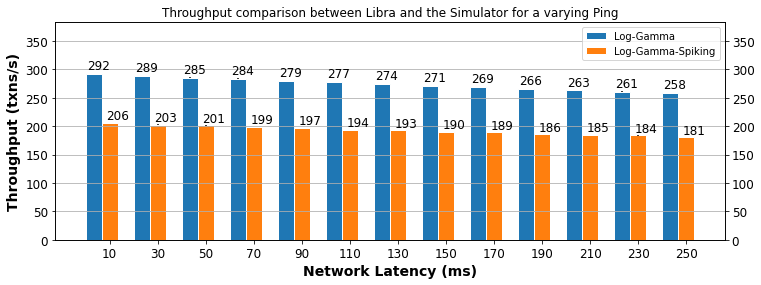

In [22]:
#Directories for the Simulator results
dir_network_latency = '/mnt/DownloadsWindowsShared/LibraSimulator-Results/ValidateSim-network-latency/attempt2/'
dir_network_latency_spiking = '/mnt/DownloadsWindowsShared/LibraSimulator-Results/ValidateSim-network-latency/attempt2-spiking/'

# Get the throughputs for the Libra-Simulator
max_tps_latency = get_max_throughput_for_libra_sim(dir_network_latency, '_delay/')
max_tps_latency_spiking = get_max_throughput_for_libra_sim(dir_network_latency_spiking, '_delay/')

# Plot and compare with Libra results
libra_sim_comparison_bar_plot([max_tps_latency, max_tps_latency_spiking], 'Network Latency (ms)', get_sorted_label_names(dir_network_latency), 'Throughput comparison between Libra and the Simulator for a varying Ping', ['Log-Gamma', 'Log-Gamma-Spiking'])
#plot_residuals(max_tps_exp2_libra, [max_tps_exp2_sim, max_tps_exp2_sim_spiking], ['Simulator-Gamma', 'Simulator-Gamma-Spiking'], get_sorted_label_names(dir_network_latency), 'Network Latency (ms)')

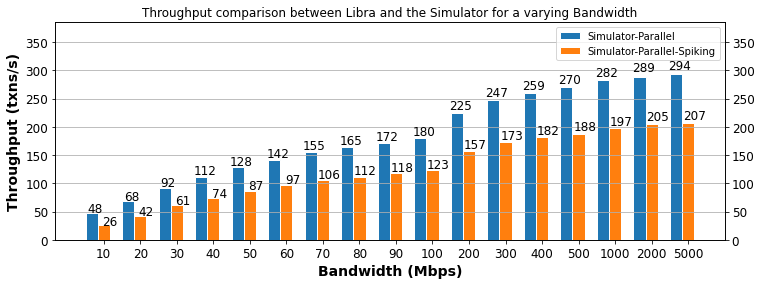

In [88]:
#Directories for the Simulator results
dir_bandwidth = '/mnt/DownloadsWindowsShared/LibraSimulator-Results/ValidateSim-bandwidth/attempt1/'
dir_bandwidth_spiking = '/mnt/DownloadsWindowsShared/LibraSimulator-Results/ValidateSim-bandwidth/attempt1-spiking/'

# Get the throughputs for the Libra-Simulator
max_tps_bandwidth = get_max_throughput_for_libra_sim(dir_bandwidth, '_bandwidth/')
max_tps_bandwidth_spiking = get_max_throughput_for_libra_sim(dir_bandwidth_spiking, '_bandwidth/')

# Plot and compare with Libra results
libra_sim_comparison_bar_plot([max_tps_bandwidth, max_tps_bandwidth_spiking], 'Upload Bandwidth (Mbps)', get_sorted_label_names(dir_bandwidth), 'Throughput comparison between Libra and the Simulator for a varying Bandwidth', ['Parallel', 'Parallel-Spiking'])
#plot_residuals(max_tps_bandwidth, [max_tps_bandwidth_spiking], ['Simulator-Sequentially', 'Simulator-Parallel-1500bit'], get_sorted_label_names(dir_bandwidth), 'Bandwidth (Mbps)')

Loggamma(min) = 294
Loggamma(max) = 1632

Loggamma-spiking(min) = 207
Loggamma-spiking(max) = 1597


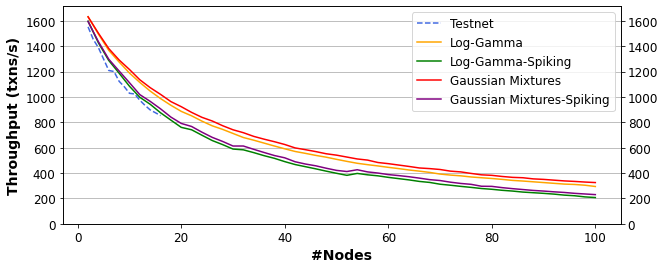

In [166]:
avg_throughputs = []
for throughputs in max_throughput_hpc_libra:
    avg_throughputs.append(np.mean(throughputs))

base_dir_loggamma = '/mnt/DownloadsWindowsShared/LibraSimulator-Results/LibraSim-Experiment1-compare/attempt16-noTimeout-hpc-loggamma-8machines-100nodes/'
base_dir_loggamma_spiking = '/mnt/DownloadsWindowsShared/LibraSimulator-Results/LibraSim-Experiment1-compare/attempt16-noTimeout-hpc-loggamma-8machines-100nodes-spiking/'
base_dir_gaussian = '/mnt/DownloadsWindowsShared/LibraSimulator-Results/LibraSim-Experiment1-compare/attempt14-noTimeout-hpc-gaussianmixture-8machines-100nodes/'
base_dir_gaussian_spiking = '/mnt/DownloadsWindowsShared/LibraSimulator-Results/LibraSim-Experiment1-compare/attempt14-noTimeout-hpc-gaussianmixture-8machines-100nodes-spiking/'

max_throughput_loggamma = get_max_throughput_for_libra_sim(base_dir_loggamma, '_nodes/')
max_throughput_loggamma_spiking = get_max_throughput_for_libra_sim(base_dir_loggamma_spiking, '_nodes/')
max_throughput_gaussian = get_max_throughput_for_libra_sim(base_dir_gaussian, '_nodes/')
max_throughput_gaussian_spiking = get_max_throughput_for_libra_sim(base_dir_gaussian_spiking, '_nodes/')

sns.set_palette(sns.color_palette(["royalblue", "orange", "green", "red", "purple"]))

# Create the figure and plot the predictions
fig, ax = plt.subplots(1, 1, figsize=(10,4))
#ax.set_title('Libra-Sim plotting throughput scaled up to 100 nodes')
#ax.set_title('Transactie Volume Simulator opgeschaald tot en met 100 Nodes')

# Plot the Libra swarm results
ax.plot(range(2, len(avg_throughputs)+2), avg_throughputs, linestyle='dashed', label='Testnet')

# Plot the simulator results
ax.plot(get_sorted_label_names(base_dir_loggamma), max_throughput_loggamma, label='Log-Gamma')
ax.plot(get_sorted_label_names(base_dir_loggamma_spiking), max_throughput_loggamma_spiking, label='Log-Gamma-Spiking')
ax.plot(get_sorted_label_names(base_dir_gaussian), max_throughput_gaussian, label='Gaussian Mixtures')
ax.plot(get_sorted_label_names(base_dir_gaussian_spiking), max_throughput_gaussian_spiking, label='Gaussian Mixtures-Spiking')
ax.set_xlabel('#Nodes', fontweight='bold')
ax.set_ylabel('Throughput (txns/s)', fontweight='bold')
#ax.set_ylabel('Transactie Volume (txns/s)', fontweight='bold')
ax.grid(axis='y')

ax.xaxis.label.set_size(14)
ax.yaxis.label.set_size(14)
ax.xaxis.set_tick_params(labelsize=12)
ax.yaxis.set_tick_params(labelsize=12)
ax.legend(fontsize=12)

ax01 = ax.twinx()
ax01.xaxis.label.set_size(14)
ax01.yaxis.label.set_size(14)
ax01.xaxis.set_tick_params(labelsize=12)
ax01.yaxis.set_tick_params(labelsize=12)

#min(max_throughput_loggamma_spiking[-1])*0.8
ax.set_ylim(0, max(max_throughput_loggamma[0])*1.05)
ax01.set_ylim(0, max(max_throughput_loggamma[0])*1.05);

print("Loggamma(min) = " + str(min(max_throughput_loggamma[-1])))
print("Loggamma(max) = " + str(max(max_throughput_loggamma[0])))
print()
print("Loggamma-spiking(min) = " + str(min(max_throughput_loggamma_spiking[-1])))
print("Loggamma-spiking(max) = " + str(max(max_throughput_loggamma_spiking[0])))



In [89]:
max_tps_mean = [int(np.mean(i)*.98) for i in max_tps_1]
print(max_tps_mean)

[1601, 1518, 1464, 1403, 1337, 1298, 1244, 1203, 1163, 1126, 1089, 1055, 1025, 996, 968]


In [85]:
print(len(max_throughput_loggamma_spiking))
for throughput in max_throughput_loggamma:
    sys.stdout.write(str(int(throughput[0]*.98)) + "," + "0,")

50
1599,0,1465,0,1339,0,1249,0,1164,0,1091,0,1025,0,967,0,915,0,868,0,833,0,792,0,756,0,729,0,697,0,666,0,645,0,623,0,600,0,579,0,558,0,543,0,528,0,514,0,497,0,482,0,467,0,456,0,446,0,436,0,426,0,415,0,406,0,396,0,384,0,376,0,370,0,361,0,355,0,349,0,343,0,335,0,330,0,324,0,318,0,312,0,306,0,303,0,297,0,288,0,

In [ ]:
blockstore_dataframe, _ = get_blockstore_dataframe_and_block_saturation(directory_tmp)

data_frame = dataframe[(dataframe['txn_rel_commit_time'] > txns_within_timeframe[index][0]) & (dataframe['txn_rel_commit_time'] < txns_within_timeframe[index][1])]['txn_latency(ms)'].reset_index()


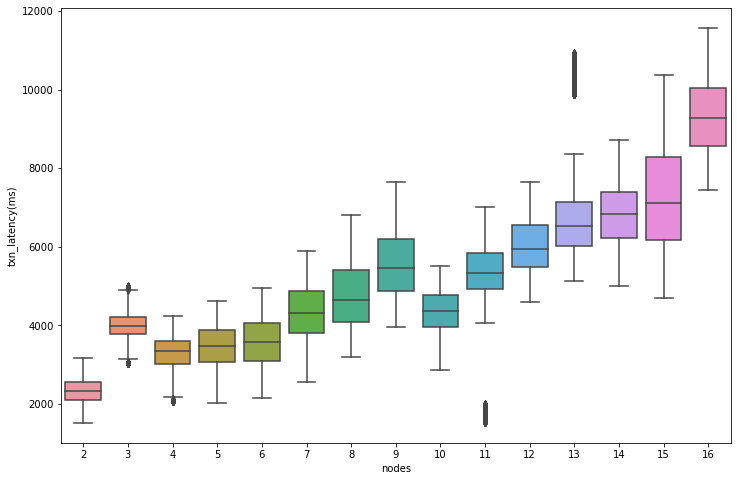

In [71]:
directory = '/home/jeanpierre/Desktop/DownloadsWindowsShared/Experiment_compare_swarm_and_simulator/hpc_logs/attempt10-8machines/'
txns_within_timeframe = [(75,125),   #2
                         (120,160),  #3
                         (125,160),  #4
                         (125,175),  #5
                         (125,190),  #6
                         (130,200),  #7
                         (150,190),  #8
                         (140,185),  #9
                         (150,175),  #10
                         (150,180),  #11
                         (175,200),  #12
                         (170,200),  #13
                         (190,220),  #14
                         (185,260),  #15
                         (190,225)]  #16

nr_nodes = []
nr_nodes_part1 = []
nr_nodes_part2 = []

for x_nodes in os.listdir(directory):
    nr_nodes_part1.append(int(x_nodes.split('_')[0]))
    nr_nodes_part2.append(str(x_nodes.split('_')[1]))

nr_nodes_part1.sort()
for node_nr in range(len(nr_nodes_part1)):
    nr_nodes.append(str(nr_nodes_part1[node_nr]) + "_" + nr_nodes_part2[node_nr])

data_frames = []
for index, x_nodes in enumerate(nr_nodes, start=0):
    for experiment_folder in os.listdir(directory + x_nodes):
        directory_tmp = directory + x_nodes + "/" + experiment_folder + "/"
        df, _ = get_blockstore_dataframe_and_block_saturation(directory_tmp)
        df = df[(df['txn_rel_commit_time'] >= txns_within_timeframe[index][0]) & (df['txn_rel_commit_time'] <= txns_within_timeframe[index][1])]['txn_latency(ms)'].reset_index()
        df['nodes'] = nr_nodes_part1[index]
        data_frames.append(df)
        break

data_frames = pd.concat(data_frames)

fig, ax0 = plt.subplots(1, 1, figsize=(12,8))
sns.color_palette("YlOrBr", as_cmap=True)
sns.boxplot(x="nodes", y="txn_latency(ms)", data=data_frames, ax=ax0);

In [25]:
def get_txn_latency_df(base_dir_sim):
    dictionary = {"latency":[], "nodes":[]}
    for experiment in get_sorted_label_names(base_dir_sim):
            latencies_array_local = []
            data_dir = os.listdir(base_dir_sim + str(experiment) + '_nodes')[0]
            for run_nr in os.listdir(base_dir_sim + str(experiment) + '_nodes/' + data_dir):
                with open(base_dir_sim + str(experiment) + '_nodes/' + data_dir + '/' + run_nr + '/' + 'output_transaction_latency_time.txt') as fp:
                    line = fp.readline()
                    while line:
                        dictionary["latency"].append(int(line.split(',')[1]))
                        dictionary["nodes"].append(int(experiment))
                        line = fp.readline()

    latencies_dataframe = pd.DataFrame(dictionary)
    return latencies_dataframe

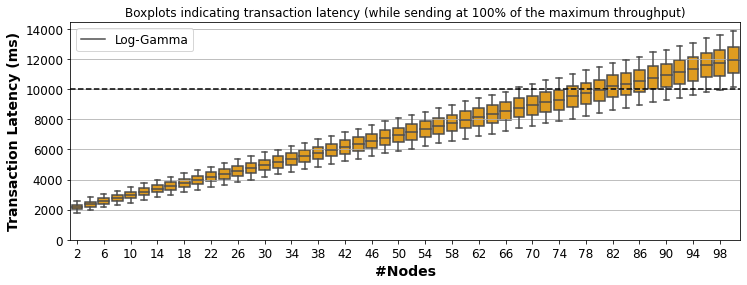

NameError: name 'loggamma_spiking_df' is not defined

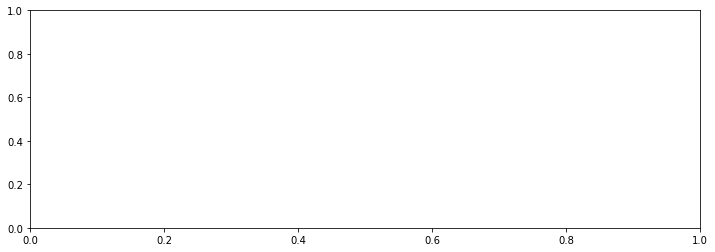

In [26]:
base_dir_sim = '/mnt/DownloadsWindowsShared/LibraSimulator-Results/LibraSim-Experiment-latency/attempt5-noTimeout-hpc-loggamma-100nodes/'
base_dir_sim_spiking = '/mnt/DownloadsWindowsShared/LibraSimulator-Results/LibraSim-Experiment-latency/attempt5-noTimeout-hpc-loggamma-100nodes-spiking/'

loggamma_df = get_txn_latency_df(base_dir_sim)
#loggamma_spiking_df = get_txn_latency_df(base_dir_sim_spiking)

fig, ax0 = plt.subplots(1, 1, figsize=(12,4))
ax0.set_title("Boxplots indicating transaction latency (while sending at 100% of the maximum throughput)")

# Plot without spiking
#sns.color_palette("YlOrBr", as_cmap=True)
sns.boxplot(x="nodes", y="latency", data=loggamma_df, ax=ax0, color="orange")
ax0.axhline(y=10000, c='black', ls='--')
ax0.set_xlabel('#Nodes', fontweight='bold')
ax0.set_ylabel('Transaction Latency (ms)', fontweight='bold')
ax0.set_ylim(ymin=0)
ax0.grid(axis='y')

ax0.legend(["Log-Gamma"], fontsize=12)
plt.xticks(np.arange(0, 50, 2))

ax0.xaxis.label.set_size(14)
ax0.yaxis.label.set_size(14)
ax0.xaxis.set_tick_params(labelsize=12)
ax0.yaxis.set_tick_params(labelsize=12)
plt.show()

fig, ax0 = plt.subplots(1, 1, figsize=(12,4))
# Plot with spiking
#sns.color_palette("YlOrBr", as_cmap=True)
sns.boxplot(x="nodes", y="latency", data=loggamma_spiking_df, ax=ax0, color="orange")
ax0.axhline(y=10000, c='black', ls='--')
ax0.set_xlabel('#Nodes', fontweight='bold')
ax0.set_ylabel('Transaction Latency (ms)', fontweight='bold')
ax0.set_ylim(ymin=0)
ax0.grid(axis='y')

ax0.legend(["Log-Gamma-Spiking"], fontsize=12)
plt.xticks(np.arange(0, 50, 2))

ax0.xaxis.label.set_size(14)
ax0.yaxis.label.set_size(14)
ax0.xaxis.set_tick_params(labelsize=12)
ax0.yaxis.set_tick_params(labelsize=12)
plt.show()

In [94]:
def get_mean_round_duration(directory, max_throughput_start_time, outlier_std, max_tps_interval):
    df = df, _ = get_blockstore_dataframe_and_block_saturation(directory)
    for index, row in df.iterrows():
        if row['txn_rel_commit_time'] >= max_throughput_start_time:
            timestamp_max_throughput = row['timestamp_commit']
            break
            
    max_tps_interval = max_tps_interval * 1000
    
    new_round_dataframe_origional = pd.read_csv(directory + "merged/jp_consensus_process_new_round.csv", names=["txns", "duration", "timeout_round", "timestamp"])
    new_round_dataframe = new_round_dataframe_origional.sort_values(["timestamp"])
    new_round_dataframe["round_time"] = new_round_dataframe.diff(axis=0)['timestamp']
    new_round_dataframe = new_round_dataframe[new_round_dataframe['txns'] == 1000]
    new_round_dataframe = new_round_dataframe[(new_round_dataframe['timestamp'] > timestamp_max_throughput) & (new_round_dataframe['timestamp'] < (timestamp_max_throughput + max_tps_interval))]
    mean_round_time = new_round_dataframe["round_time"].mean()
    new_round_dataframe = new_round_dataframe[new_round_dataframe['round_time'] < mean_round_time + outlier_std*new_round_dataframe['round_time'].std()]
    
    # This is the mean round time without the outliers
    print(mean_round_time)
    mean_round_time = new_round_dataframe["round_time"].mean()
    print(mean_round_time)

    min_txn_delay = 3*mean_round_time
    max_txn_delay = 4*mean_round_time
    samples = np.arange(min_txn_delay, max_txn_delay, 1, dtype=int)
    
    return samples

In [35]:
get_mean_round_duration('/home/jeanpierre/libra2/libra2/experiments_logs/hpc_logs/attempt10-8machines/16_nodes/2021_01_05__19_01_03/', 75, 3, 120)

1178.638888888889
973.9420289855072


array([2921, 2922, 2923, 2924, 2925, 2926, 2927, 2928, 2929, 2930, 2931,
       2932, 2933, 2934, 2935, 2936, 2937, 2938, 2939, 2940, 2941, 2942,
       2943, 2944, 2945, 2946, 2947, 2948, 2949, 2950, 2951, 2952, 2953,
       2954, 2955, 2956, 2957, 2958, 2959, 2960, 2961, 2962, 2963, 2964,
       2965, 2966, 2967, 2968, 2969, 2970, 2971, 2972, 2973, 2974, 2975,
       2976, 2977, 2978, 2979, 2980, 2981, 2982, 2983, 2984, 2985, 2986,
       2987, 2988, 2989, 2990, 2991, 2992, 2993, 2994, 2995, 2996, 2997,
       2998, 2999, 3000, 3001, 3002, 3003, 3004, 3005, 3006, 3007, 3008,
       3009, 3010, 3011, 3012, 3013, 3014, 3015, 3016, 3017, 3018, 3019,
       3020, 3021, 3022, 3023, 3024, 3025, 3026, 3027, 3028, 3029, 3030,
       3031, 3032, 3033, 3034, 3035, 3036, 3037, 3038, 3039, 3040, 3041,
       3042, 3043, 3044, 3045, 3046, 3047, 3048, 3049, 3050, 3051, 3052,
       3053, 3054, 3055, 3056, 3057, 3058, 3059, 3060, 3061, 3062, 3063,
       3064, 3065, 3066, 3067, 3068, 3069, 3070, 30

In [120]:
def get_mean_round_duration_array(directory, max_throughput_start_array, outlier_std, max_tps_interval):
    nr_nodes = []
    nr_nodes_part1 = []
    nr_nodes_part2 = []

    for x_nodes in os.listdir(directory):
        if x_nodes.find("_") != -1:
            nr_nodes_part1.append(int(x_nodes.split('_')[0]))
            nr_nodes_part2.append(str(x_nodes.split('_')[1]))

    nr_nodes_part1.sort()
    for node_nr in range(len(nr_nodes_part1)):
        nr_nodes.append(str(nr_nodes_part1[node_nr]) + "_" + nr_nodes_part2[node_nr])
        
    #samples_array = []
    df = pd.DataFrame(columns = ['nodes', 'samples', 'data'])
    for index, x_nodes in enumerate(nr_nodes):
        for experiment_folder in os.listdir(directory + x_nodes):
            nr_nodes = nr_nodes_part1[index]
            samples = get_mean_round_duration(directory + x_nodes + '/' + experiment_folder + '/', max_throughput_start_array[index], outlier_std, max_tps_interval)
            df_2 = {'nodes':np.full(len(samples),nr_nodes_part1[index]) , 'samples':samples, 'data':'Testnet'}
            df_2 = pd.DataFrame.from_dict(df_2)
            df = df.append(df_2, ignore_index=True)
            #samples_array.append(samples)
            break
            
    return df

In [121]:
base_dir_sim = '/mnt/DownloadsWindowsShared/LibraSimulator-Results/LibraSim-Experiment-latency/attempt5-noTimeout-hpc-loggamma-16nodes-attempt10-8machines/'

dictionary = {"nodes":[], "samples":[], "data":[]}
for experiment in get_sorted_label_names(base_dir_sim):
        latencies_array_local = []
        data_dir = os.listdir(base_dir_sim + str(experiment) + '_nodes')[0]
        for run_nr in os.listdir(base_dir_sim + str(experiment) + '_nodes/' + data_dir):
            with open(base_dir_sim + str(experiment) + '_nodes/' + data_dir + '/' + run_nr + '/' + 'output_transaction_latency_time.txt') as fp:
                line = fp.readline()
                while line:
                    dictionary["samples"].append(int(line.split(',')[1]))
                    dictionary["nodes"].append(int(experiment))
                    dictionary["data"].append("Log-Gamma")
                    line = fp.readline()
                    
df_latency_loggamma = pd.DataFrame(dictionary)
#print(latencies_dataframe)

In [122]:
max_tps_hpc = [54, 39, 41, 54, 53, 50, 62, 84, 103, 62, 76, 104, 97, 59, 75]
df_latency_libra = get_mean_round_duration_array('/home/jeanpierre/libra2/libra2/experiments_logs/hpc_logs/attempt10-8machines/', max_tps_hpc, 3.3, 120)

652.3851851851852
630.2015503875969
693.5
667.2307692307693
728.4054054054054
683.3943661971831
775.811320754717
734.5922330097087
807.5512820512821
747.1866666666666
843.3793103448276
753.0120481927711
903.2857142857143
806.7611940298508
935.1789473684211
831.7692307692307
968.7127659574468
871.9230769230769
988.3552631578947
872.7397260273973
1045.4375
941.1290322580645
1079.8372093023256
941.0240963855422
1141.9594594594594
967.0140845070423
1144.7142857142858
955.525
1178.638888888889
973.9420289855072


In [45]:
#print(df_latency_libra)

result = []
for i in range(2, 17):
    result_df_libra = df_latency_libra[df_latency_libra['nodes'] == i]['samples'].mean()
    result_df_loggamma = df_latency_loggamma[df_latency_loggamma['nodes'] == i]['samples'].mean()
    result.append(result_df_loggamma/result_df_libra*100)
    print(result_df_loggamma/result_df_libra*100)
    
print()
print(np.mean(result))

98.8163838800409
97.76288990781474
99.07146497323002
97.08888478348302
99.00218795969006
102.09753010044021
98.73481550183652
99.33974181821141
97.55138792419292
101.07240238402078
97.00555027754486
99.42526188714241
100.41335824378254
104.43219584223236
105.10079860167119

99.79432360568893


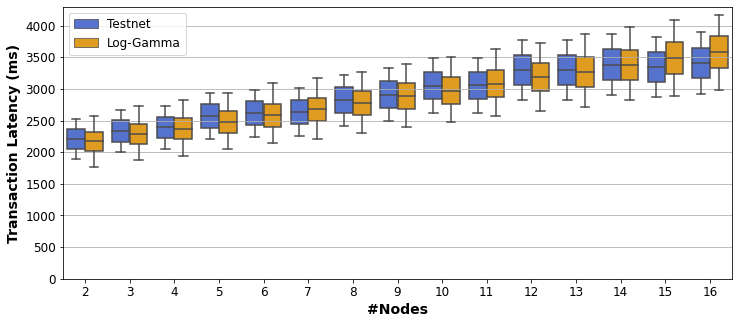

In [124]:
result_df = df_latency_libra.append(df_latency_loggamma, ignore_index=True)
#print(result_df)
fig, ax0 = plt.subplots(1, 1, figsize=(12,5))
#sns.color_palette("YlOrBr", as_cmap=True)
sns.set_palette(sns.color_palette(["royalblue", "orange"]))
sns.boxplot(x='nodes', y='samples', hue='data', data=result_df, ax=ax0)

ax0.grid(axis='y')
ax0.xaxis.label.set_size(14)
ax0.yaxis.label.set_size(14)
ax0.xaxis.set_tick_params(labelsize=12)
ax0.yaxis.set_tick_params(labelsize=12)
ax0.set_ylabel('Transaction Latency (ms)', fontweight='bold')
ax0.set_xlabel('#Nodes', fontweight='bold')
ax0.set_ylim(ymin=0)
ax0.legend(fontsize=12);

In [20]:
def get_mean_round_duration_array(directory, max_throughput_start_array, outlier_std, max_tps_interval):
    nr_nodes = []
    nr_nodes_part1 = []
    nr_nodes_part2 = []

    for x_nodes in os.listdir(directory):
        if x_nodes.find("_") != -1:
            nr_nodes_part1.append(int(x_nodes.split('_')[0]))
            nr_nodes_part2.append(str(x_nodes.split('_')[1]))

    nr_nodes_part1.sort()
    for node_nr in range(len(nr_nodes_part1)):
        nr_nodes.append(str(nr_nodes_part1[node_nr]) + "_" + nr_nodes_part2[node_nr])
        
    frequency_array = []
    duration_array = []
    for index, x_nodes in enumerate(nr_nodes):
        for experiment_folder in os.listdir(directory + x_nodes):
            nr_nodes = nr_nodes_part1[index]
            frequency, duration = get_spiking_freq_and_duration(directory + x_nodes + '/' + experiment_folder + '/', max_throughput_start_array[index], outlier_std, max_tps_interval)
            frequency_array.append( (nr_nodes_part1[index], frequency) )
            duration_array.append( (nr_nodes_part1[index], duration) )
            
    return frequency_array, duration_array

In [21]:
def get_spiking_freq_and_duration(directory, max_throughput_start_time, outlier_std, max_tps_interval):
    df = df, _ = get_blockstore_dataframe_and_block_saturation(directory)
    for index, row in df.iterrows():
        if row['txn_rel_commit_time'] >= max_throughput_start_time:
            timestamp_max_throughput = row['timestamp_commit']
            break
            
    max_tps_interval = max_tps_interval * 1000
    
    new_round_dataframe_origional = pd.read_csv(directory + "merged/jp_consensus_process_new_round.csv", names=["txns", "duration", "timeout_round", "timestamp"])
    new_round_dataframe = new_round_dataframe_origional.sort_values(["timestamp"])
    new_round_dataframe["round_time"] = new_round_dataframe.diff(axis=0)['timestamp']
    new_round_dataframe = new_round_dataframe[(new_round_dataframe['timestamp'] > timestamp_max_throughput) & (new_round_dataframe['timestamp'] < (timestamp_max_throughput + max_tps_interval))]
    mean_round_time = new_round_dataframe["round_time"].mean()
    new_round_dataframe = new_round_dataframe[new_round_dataframe['round_time'] >= new_round_dataframe['round_time'].mean() + outlier_std*new_round_dataframe['round_time'].std()]
    new_round_dataframe["diff_between_spikes"] = new_round_dataframe.diff(axis=0)["timestamp"]
    average_spiking_interval = new_round_dataframe["diff_between_spikes"].mean()
    #print("avg_spike_interval = " + str(average_spiking_interval))

    average_lost_round_time = (new_round_dataframe["round_time"].sum() - (mean_round_time * len(new_round_dataframe))) / len(new_round_dataframe)
    #print("avg_lost_round_time = " + str(average_lost_round_time))

    #print(new_round_dataframe[:10])
    plt.hist(new_round_dataframe['round_time'], bins='auto')
    #plt.show()
    #print(new_round_dataframe['round_time'].mean())
    
    return average_spiking_interval, average_lost_round_time

In [22]:
def get_spiking_freq_and_duration_array(directory, max_throughput_start_array, outlier_std, max_tps_interval):
    nr_nodes = []
    nr_nodes_part1 = []
    nr_nodes_part2 = []

    for x_nodes in os.listdir(directory):
        if x_nodes.find("_") != -1:
            nr_nodes_part1.append(int(x_nodes.split('_')[0]))
            nr_nodes_part2.append(str(x_nodes.split('_')[1]))

    nr_nodes_part1.sort()
    for node_nr in range(len(nr_nodes_part1)):
        nr_nodes.append(str(nr_nodes_part1[node_nr]) + "_" + nr_nodes_part2[node_nr])
        
    frequency_array = []
    duration_array = []
    for index, x_nodes in enumerate(nr_nodes):
        for experiment_folder in os.listdir(directory + x_nodes):
            nr_nodes = nr_nodes_part1[index]
            frequency, duration = get_spiking_freq_and_duration(directory + x_nodes + '/' + experiment_folder + '/', max_throughput_start_array[index], outlier_std, max_tps_interval)
            frequency_array.append( (nr_nodes_part1[index], frequency) )
            duration_array.append( (nr_nodes_part1[index], duration) )
            
    return frequency_array, duration_array

In [23]:
def plot_spiking_models(frequency_array, duration_array, x_axis_name, degree_interval, degree_duration):
    f_x, f_y = zip(*frequency_array)
    d_x, d_y = zip(*duration_array)

    # Delete nan values
    f_x = np.array(f_x); f_y = np.array(f_y); d_x = np.array(d_x); d_y = np.array(d_y); 
    d_x = d_x[~np.isnan(f_y)]
    d_y = d_y[~np.isnan(f_y)]
    f_x = f_x[~np.isnan(f_y)]
    f_y = f_y[~np.isnan(f_y)]
    
    fig, (ax0, ax1, ax2, ax3) = plt.subplots(4, 1, figsize=(10,8))

    #Plot
    coefficients_freq = np.polyfit(f_x, f_y, degree_interval)
    poly_freq = np.poly1d(coefficients_freq)
    ax0.plot(range(2, max(f_x)+1), poly_freq(range(2, max(f_x)+1)), label='Interval Linear Model')
    ax0.plot(f_x, f_y, '.', label='Measured Interval')
    ax0.set_ylabel('Interval (ms)', fontweight='bold')
    #Residual
    pred_y = f_y - poly_freq(f_x)
    ax1.plot(f_x, pred_y, '.')
    ax1.set_xlabel('', fontweight='bold')
    ax1.set_ylabel('Residuals', fontweight='bold')
    ax1.grid(axis='y')
    ax1.axhline(y=0, c='black', ls='--')
    #Plot
    coefficients_dur = np.polyfit(d_x, d_y, degree_duration)
    poly_dur = np.poly1d(coefficients_dur)
    ax2.plot(d_x, d_y, '.', label='Measured Duration')
    ax2.plot(range(2, max(d_x)+1), poly_dur(range(2, max(d_x)+1)), label='Duration Linear Model')
    ax2.set_ylabel('Duration (ms)', fontweight='bold')
    #Residual
    pred_y = d_y - poly_dur(d_x)
    ax3.plot(d_x, pred_y, '.')
    ax3.set_xlabel(x_axis_name, fontweight='bold')
    ax3.set_ylabel('Residuals', fontweight='bold')
    ax3.grid(axis='y')
    ax3.axhline(y=0, c='black', ls='--')
    
    #print R2 score
    print(str(r2_score(f_y, poly_freq(f_x))))
    print(str(r2_score(d_y, poly_dur(d_x))))
    
    ax0.grid(axis='y')
    ax1.grid(axis='y')

    ax0.legend(fontsize=12)
    ax1.legend(fontsize=12)
    ax2.legend(fontsize=12)
    ax3.legend(fontsize=12)
    
    ax0.xaxis.label.set_size(14)
    ax0.yaxis.label.set_size(14)
    ax0.xaxis.set_tick_params(labelsize=12)
    ax0.yaxis.set_tick_params(labelsize=12)
    ax1.xaxis.label.set_size(14)
    ax1.yaxis.label.set_size(14)
    ax1.xaxis.set_tick_params(labelsize=12)
    ax1.yaxis.set_tick_params(labelsize=12)
    ax2.xaxis.label.set_size(14)
    ax2.yaxis.label.set_size(14)
    ax2.xaxis.set_tick_params(labelsize=12)
    ax2.yaxis.set_tick_params(labelsize=12)
    ax3.xaxis.label.set_size(14)
    ax3.yaxis.label.set_size(14)
    ax3.xaxis.set_tick_params(labelsize=12)
    ax3.yaxis.set_tick_params(labelsize=12)
    
    plt.show()
    
    print('Model parameters:')
    print('Frequency:')
    print(coefficients_freq)
    print('Duration:')
    print(coefficients_dur);

In [ ]:
max_tps_hpc = [54, 39, 41, 54, 53, 50, 62, 84, 103, 62, 76, 104, 97, 59, 75]

frequency_array_1, duration_array_1 = get_spiking_freq_and_duration_array("/home/jeanpierre/libra2/libra2/experiments_logs/hpc_logs/attempt10-8machines/", max_tps_hpc, 4, 120)

No handles with labels found to put in legend.
No handles with labels found to put in legend.


0.36478773726982994
0.9615777039805953


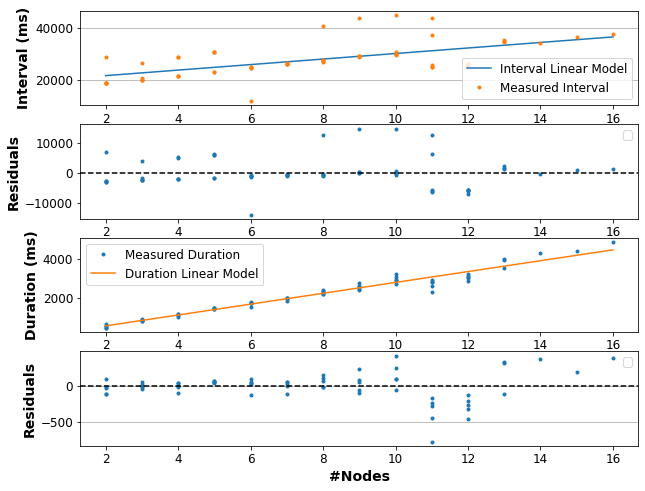

Model parameters:
Frequency:
[ 1060.71154696 19599.36231377]
Duration:
[278.23623766  24.71119147]


In [125]:
plot_spiking_models(frequency_array_1, duration_array_1, "#Nodes", 1, 1)

In [ ]:
max_tps_azure_exp1 = [39, 58, 69, 71, 78, 67, 51, 83, 81, 91, 94, 101, 117, 104, 117]

frequency_array_2, duration_array_2 = get_spiking_freq_and_duration_array("/home/jeanpierre/libra2/libra2/experiments_logs/Experiment_compare_swarm_and_simulator/Experiment1/attempt1/", max_tps_azure_exp1, 3, 140);

No handles with labels found to put in legend.
No handles with labels found to put in legend.


0.6189264428402312
0.8942841477489429


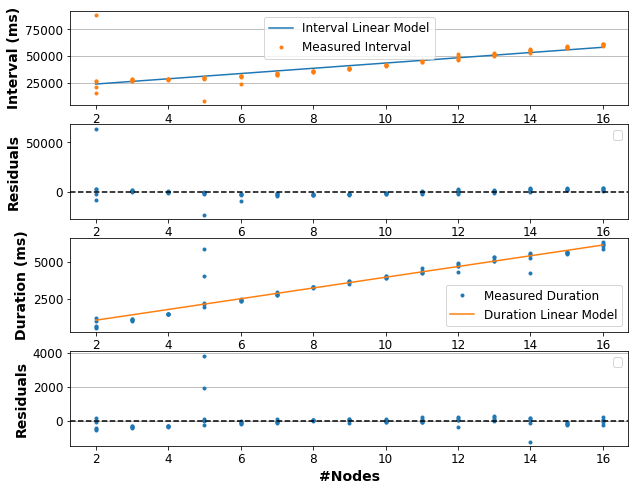

Model parameters:
Frequency:
[ 2438.81913095 19386.4444881 ]
Duration:
[369.80931023 274.42553167]


In [126]:
plot_spiking_models(frequency_array_2, duration_array_2, "#Nodes", 1, 1);

In [ ]:
max_tps_azure_exp2 = [170, 186, 62, 100, 203, 114, 148, 156, 47, 76, 135, 132, 94]

frequency_array_3, duration_array_3 = get_spiking_freq_and_duration_array("/home/jeanpierre/libra2/libra2/experiments_logs/Experiment_compare_swarm_and_simulator/Experiment2/attempt1/", max_tps_azure_exp2, 3, 140)

No handles with labels found to put in legend.
No handles with labels found to put in legend.


0.5422305155340716
0.5102582384564205


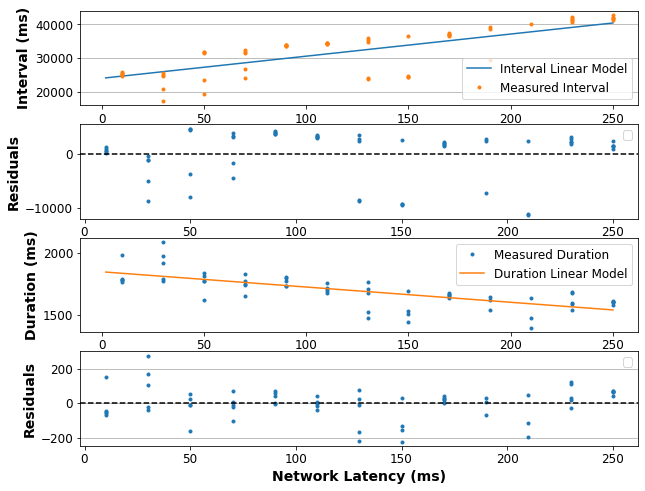

Model parameters:
Frequency:
[   65.91537879 23968.27570707]
Duration:
[-1.22552764e+00  1.84563260e+03]


In [127]:
plot_spiking_models(frequency_array_3, duration_array_3, "Network Latency (ms)", 1, 1)

In [ ]:
max_tps_azure_exp3 = [159, 194, 108, 102, 66, 193, 195, 195, 41, 131, 93, 93, 122, 157]

frequency_array_4, duration_array_4 = get_spiking_freq_and_duration_array("/home/jeanpierre/libra2/libra2/experiments_logs/Experiment_compare_swarm_and_simulator/Experiment3/attempt1/", max_tps_azure_exp3, 3, 140)

No handles with labels found to put in legend.
No handles with labels found to put in legend.


0.3174153321524462
0.027592438771627648


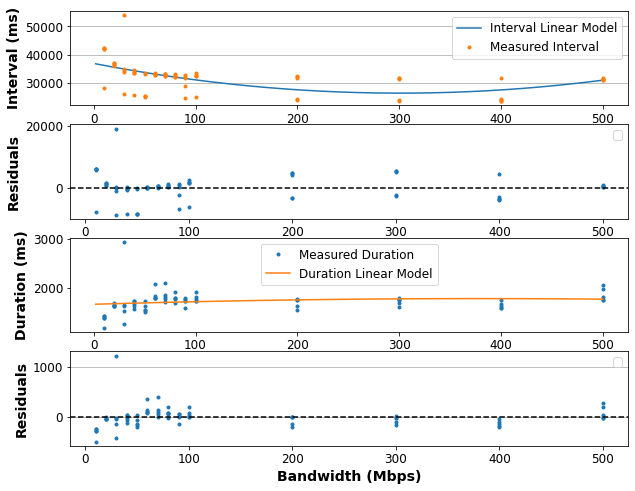

Model parameters:
Frequency:
[ 1.16360961e-01 -7.00642273e+01  3.68849841e+04]
Duration:
[-7.96710825e-04  6.03250309e-01  1.67987092e+03]


In [134]:
plot_spiking_models(frequency_array_4, duration_array_4, "Bandwidth (Mbps)", 2, 2)

In [ ]:
max_tps_azure_exp4 = [136, 99, 78, 75, 67, 69, 44, 196, 186, 89, 92, 150]

frequency_array_5, duration_array_5 = get_spiking_freq_and_duration_array("/home/jeanpierre/libra2/libra2/experiments_logs/Experiment_compare_swarm_and_simulator/Experiment4/attempt1/", max_tps_azure_exp4, 3, 140)

No handles with labels found to put in legend.
No handles with labels found to put in legend.


0.38524795783002286
0.39750396864102866


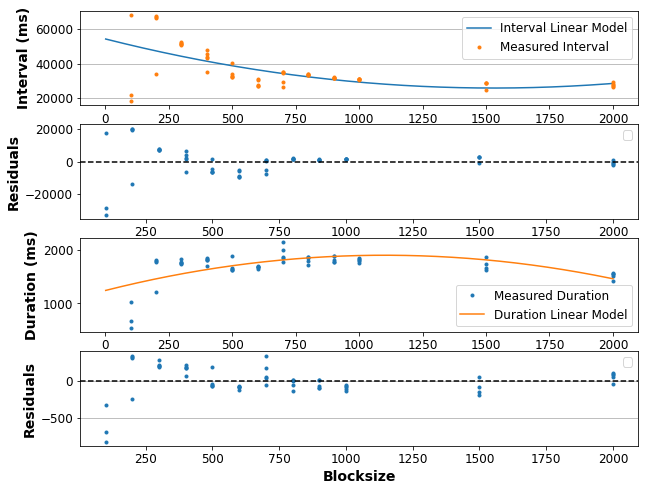

Model parameters:
Frequency:
[ 1.21616020e-02 -3.72392594e+01  5.43363422e+04]
Duration:
[-5.47307639e-04  1.20506297e+00  1.24320669e+03]


In [133]:
plot_spiking_models(frequency_array_5, duration_array_5, "Blocksize", 2, 2)